In [1]:
import pandas as pd

# Cargar el archivo CSV en un DataFrame, permitiendo la detección de tipo más precisa
df = pd.read_csv('generadoras_activas_corregido.csv', low_memory=False)

Valores de WSS para cada k:
k = 1: WSS = 871741.00
k = 2: WSS = 216441.94
k = 3: WSS = 100060.79
k = 4: WSS = 63012.55
k = 5: WSS = 39764.39
k = 6: WSS = 29199.84
k = 7: WSS = 22269.65
k = 8: WSS = 16121.02
k = 9: WSS = 12604.98
k = 10: WSS = 10382.37


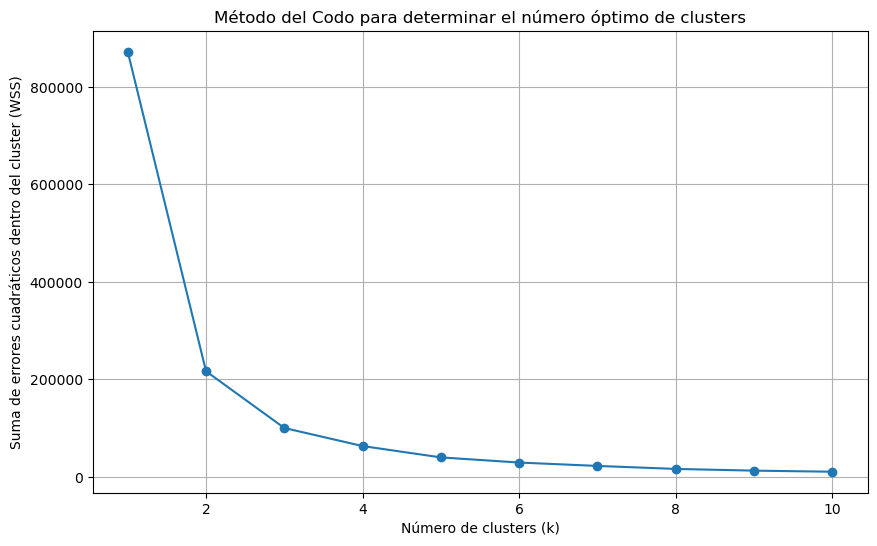

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Asegúrate de que las fechas en el DataFrame original estén en el formato datetime
df['FECHA'] = pd.to_datetime(df['FECHA'])

# Agrupar por fecha y llave, y sumar la columna 'TOTAL'
energia_por_fecha = df.groupby(['LLAVE NOMBRE', 'FECHA'])['TOTAL'].sum().reset_index()

# Preparar los datos para el clustering usando la columna 'TOTAL'
X = energia_por_fecha[['TOTAL']]

# Normalizar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Determinar el número óptimo de clusters utilizando el método del codo
wss = []
k_values = range(1, 11)  # Probar de 1 a 20 clusters

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_scaled)
    wss.append(kmeans.inertia_)

# Imprimir los valores de WSS para cada k
print('Valores de WSS para cada k:')
for k, wss_value in zip(k_values, wss):
    print(f'k = {k}: WSS = {wss_value:.2f}')

# Graficar el WSS para encontrar el codo
plt.figure(figsize=(10, 6))
plt.plot(k_values, wss, marker='o')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Suma de errores cuadráticos dentro del cluster (WSS)')
plt.title('Método del Codo para determinar el número óptimo de clusters')
plt.grid(True)
plt.show()


Probando con métrica: EUCLIDEAN
n_clusters = 2, Prediction Strength = 0.51, Tiempo de ejecución = 0.51 s
n_clusters = 3, Prediction Strength = 0.52, Tiempo de ejecución = 1.70 s
n_clusters = 4, Prediction Strength = 0.64, Tiempo de ejecución = 0.46 s
n_clusters = 5, Prediction Strength = 0.65, Tiempo de ejecución = 0.46 s
n_clusters = 6, Prediction Strength = 0.70, Tiempo de ejecución = 0.50 s
n_clusters = 7, Prediction Strength = 0.71, Tiempo de ejecución = 0.45 s
n_clusters = 8, Prediction Strength = 0.74, Tiempo de ejecución = 0.94 s
n_clusters = 9, Prediction Strength = 0.77, Tiempo de ejecución = 0.64 s
n_clusters = 10, Prediction Strength = 0.77, Tiempo de ejecución = 0.64 s
n_clusters = 11, Prediction Strength = 0.77, Tiempo de ejecución = 0.76 s
n_clusters = 12, Prediction Strength = 0.80, Tiempo de ejecución = 0.70 s
n_clusters = 13, Prediction Strength = 0.80, Tiempo de ejecución = 0.64 s
n_clusters = 14, Prediction Strength = 0.80, Tiempo de ejecución = 0.60 s
n_clusters = 1

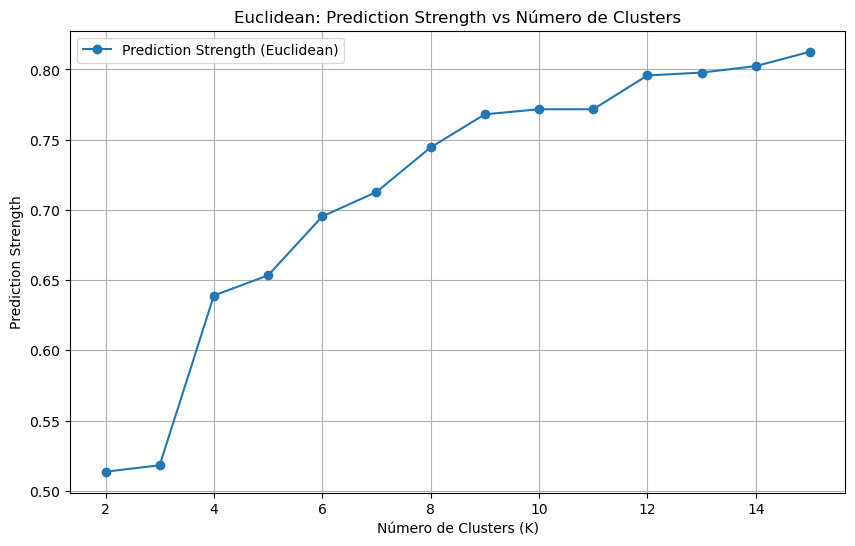

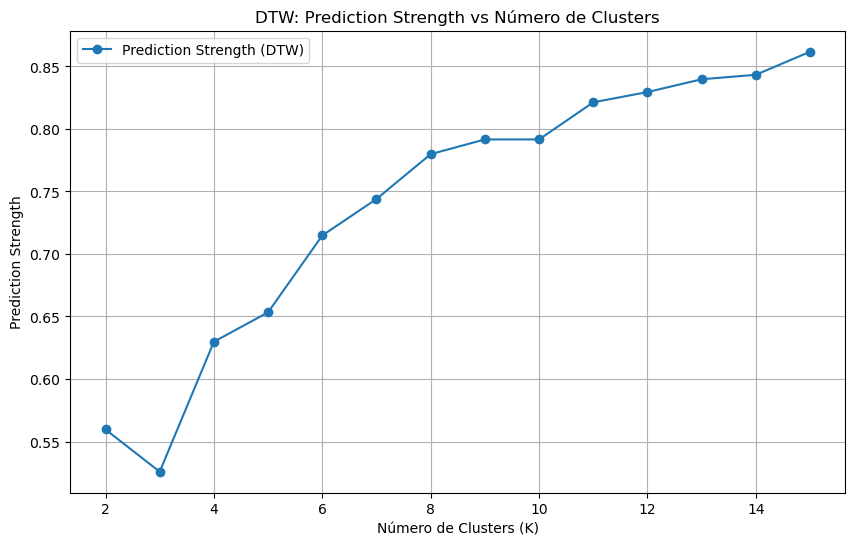

In [6]:
import pandas as pd
from tslearn.preprocessing import TimeSeriesScalerMinMax
from tslearn.clustering import TimeSeriesKMeans
from sklearn.model_selection import train_test_split
import time
import numpy as np
import matplotlib.pyplot as plt

# Función para calcular el Prediction Strength
def prediction_strength(train_labels, val_labels, n_clusters):
    """Calcula el Prediction Strength ajustado para tamaños diferentes de conjuntos"""
    def cluster_membership_matrix(labels, n_clusters):
        n_samples = len(labels)
        membership = np.zeros((n_samples, n_samples))
        
        for i in range(n_samples):
            for j in range(n_samples):
                if labels[i] == labels[j]:
                    membership[i, j] = 1
        return membership

    # Obtener matrices de pertenencia
    train_membership_matrix = cluster_membership_matrix(train_labels, n_clusters)
    val_membership_matrix = cluster_membership_matrix(val_labels, n_clusters)
    
    total_pairs = 0
    consistent_pairs = 0
    
    # Calcular consistencia para pares juntos y separados
    for i in range(min(len(train_labels), len(val_labels))):
        for j in range(i + 1, min(len(train_labels), len(val_labels))):
            # Pares juntos en entrenamiento
            if train_membership_matrix[i, j] == 1:
                total_pairs += 1
                if val_membership_matrix[i, j] == 1:
                    consistent_pairs += 1
            # Pares separados en entrenamiento
            elif train_membership_matrix[i, j] == 0:
                total_pairs += 1
                if val_membership_matrix[i, j] == 0:
                    consistent_pairs += 1

    return consistent_pairs / total_pairs if total_pairs > 0 else 0

# Agrupar por fecha y llave, y sumar la columna 'TOTAL'
energia_por_fecha = df.groupby(['LLAVE NOMBRE', 'FECHA'])['TOTAL'].sum().reset_index()

# Pivotar los datos para tener fechas como columnas y llaves como filas
pivot_df = energia_por_fecha.pivot(index='LLAVE NOMBRE', columns='FECHA', values='TOTAL').fillna(0)

# Convertir las columnas de fecha a datetime
pivot_df.columns = pd.to_datetime(pivot_df.columns)

# Añadir la columna de nombres de generadoras al DataFrame
pivot_df['LLAVE NOMBRE'] = pivot_df.index

# Separar en 90% entrenamiento y 10% validación
train_df, val_df = train_test_split(pivot_df, test_size=0.1, random_state=42, stratify=None)

# Convertir los DataFrames de entrenamiento y validación a un formato adecuado para DTW
train_data = train_df.drop(columns=['LLAVE NOMBRE']).values
val_data = val_df.drop(columns=['LLAVE NOMBRE']).values

# Normalización de series temporales
scaler = TimeSeriesScalerMinMax()
train_data_normalized = scaler.fit_transform(train_data.reshape((train_data.shape[0], train_data.shape[1], 1)))
val_data_normalized = scaler.transform(val_data.reshape((val_data.shape[0], val_data.shape[1], 1)))

# Lista para guardar los resultados de cada métrica
results_euclidean = []
results_dtw = []

# Rango de valores para n_clusters
n_clusters_range = range(2, 16)  

# Probar con diferentes combinaciones de métrica y número de clústeres
for metric in ['euclidean', 'dtw']:  # Ahora probamos tanto Euclidean como DTW
    print(f"Probando con métrica: {metric.upper()}")

    for n_clusters in n_clusters_range:
        # Iniciar cronómetro
        start_time = time.time()

        # Aplicar K-means en el conjunto de entrenamiento
        model = TimeSeriesKMeans(n_clusters=n_clusters, metric=metric, random_state=0)
        train_labels = model.fit_predict(train_data_normalized)

        # Evaluar el modelo en el conjunto de validación
        val_labels = model.predict(val_data_normalized)

        # Calcular el Prediction Strength
        ps_score = prediction_strength(train_labels, val_labels, n_clusters)

        # Detener el cronómetro
        end_time = time.time()

        # Calcular el tiempo de ejecución
        execution_time = end_time - start_time

        # Imprimir el valor de Prediction Strength y el tiempo de ejecución
        print(f"n_clusters = {n_clusters}, Prediction Strength = {ps_score:.2f}, Tiempo de ejecución = {execution_time:.2f} s")

        # Guardar los resultados para este valor de k
        result = {
            'k': n_clusters,
            'Prediction Strength': ps_score,
            'Execution Time (s)': execution_time
        }
        
        # Almacenar resultados en el DataFrame correspondiente
        if metric == 'euclidean':
            results_euclidean.append(result)
        else:
            results_dtw.append(result)  # Ahora también guardamos los resultados de DTW

# Convertir resultados a DataFrame para graficar
df_euclidean = pd.DataFrame(results_euclidean)
df_dtw = pd.DataFrame(results_dtw)

# Graficar resultados para métrica Euclidean
plt.figure(figsize=(10, 6))
plt.plot(df_euclidean['k'], df_euclidean['Prediction Strength'], label='Prediction Strength (Euclidean)', marker='o')
plt.xlabel('Número de Clusters (K)')
plt.ylabel('Prediction Strength')
plt.title('Euclidean: Prediction Strength vs Número de Clusters')
# Configurar el eje X para mostrar solo números enteros
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.legend()
plt.grid(True)
plt.show()

# Verificar si hay resultados de DTW antes de graficar
if not df_dtw.empty:
    # Graficar resultados para métrica DTW
    plt.figure(figsize=(10, 6))
    plt.plot(df_dtw['k'], df_dtw['Prediction Strength'], label='Prediction Strength (DTW)', marker='o')
    plt.xlabel('Número de Clusters (K)')
    plt.ylabel('Prediction Strength')
    plt.title('DTW: Prediction Strength vs Número de Clusters')
    # Configurar el eje X para mostrar solo números enteros
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("No hay resultados para DTW.")


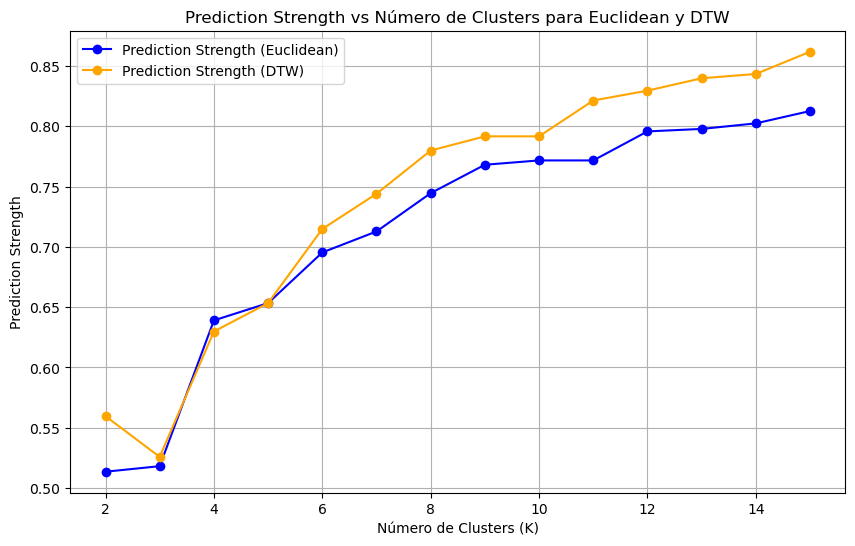

In [7]:
# Convertir resultados a DataFrame para graficar
df_euclidean = pd.DataFrame(results_euclidean)
df_dtw = pd.DataFrame(results_dtw)

# Graficar ambos resultados en una sola figura
plt.figure(figsize=(10, 6))

# Graficar para Euclidean en azul
plt.plot(df_euclidean['k'], df_euclidean['Prediction Strength'], label='Prediction Strength (Euclidean)', marker='o', color='blue')

# Graficar para DTW en naranja si no está vacío
if not df_dtw.empty:
    plt.plot(df_dtw['k'], df_dtw['Prediction Strength'], label='Prediction Strength (DTW)', marker='o', color='orange')

# Configuración de la gráfica
plt.xlabel('Número de Clusters (K)')
plt.ylabel('Prediction Strength')
plt.title('Prediction Strength vs Número de Clusters para Euclidean y DTW')
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.legend()
plt.grid(True)
plt.show()


1. Prediction Strength:
La Prediction Strength mide la estabilidad del clustering. Buscamos un valor de k donde esta métrica sea alta (indica clusters consistentes).
Los valores de Prediction Strength aumentan progresivamente y alcanzan un máximo en k = 19 con un valor de 0.90 para DTW y 0.84 para Euclidean.
2. WSS (Suma de errores cuadráticos dentro del cluster):
La métrica de WSS disminuye significativamente hasta k = 6. Después de este valor, la reducción en WSS es menos drástica, lo que sugiere que los beneficios adicionales de agregar más clusters se reducen.
Esto significa que k = 6 es un buen punto de corte desde el punto de vista de WSS, ya que se logra una buena compactación de los clusters con una reducción significativa en la variabilidad intra-cluster.

k = 6 es un buen valor considerando un equilibrio entre Prediction Strength, WSS, y tiempo de ejecución.

Tiempo de ejecución: 0.85 segundos
Tiempo de ejecución: 0.01 minutos
Índice de Silueta: 0.41
Proporción total de cada tipo de generadora:
         TIPO  Total
0       Solar    222
1     Térmica    215
2  Hidráulica    152
3      Eólica     34

Totales, cantidades y porcentajes de cada cluster:
Cluster 0 - Total generadoras: 191
Cantidad y porcentaje por tipo en el cluster 0:
            Cantidad  Porcentaje
Térmica          167   87.434555
Hidráulica        16    8.376963
Solar              7    3.664921
Eólica             1    0.523560

Cluster 4 - Total generadoras: 43
Cantidad y porcentaje por tipo en el cluster 4:
            Cantidad  Porcentaje
Solar             27   62.790698
Hidráulica         9   20.930233
Térmica            6   13.953488
Eólica             1    2.325581

Cluster 5 - Total generadoras: 60
Cantidad y porcentaje por tipo en el cluster 5:
            Cantidad  Porcentaje
Hidráulica        59   98.333333
Térmica            1    1.666667

Cluster 3 - Total generado

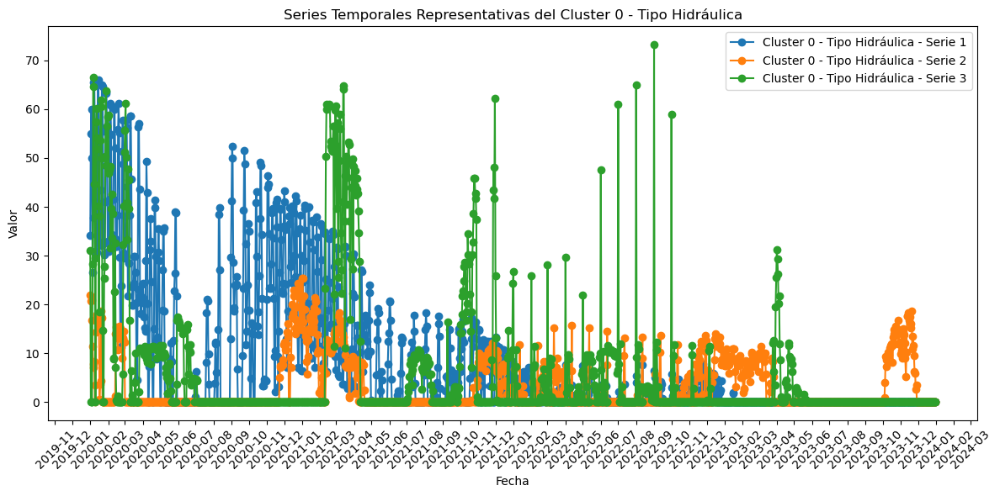

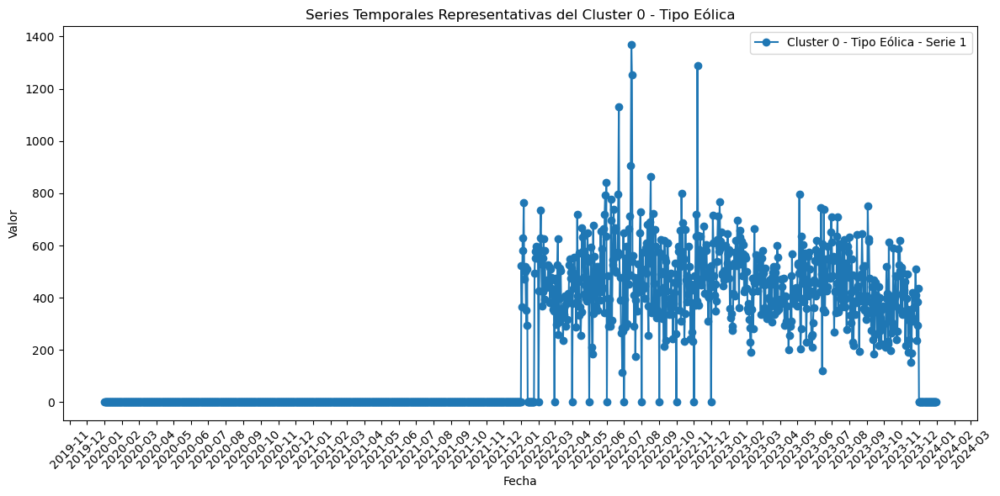

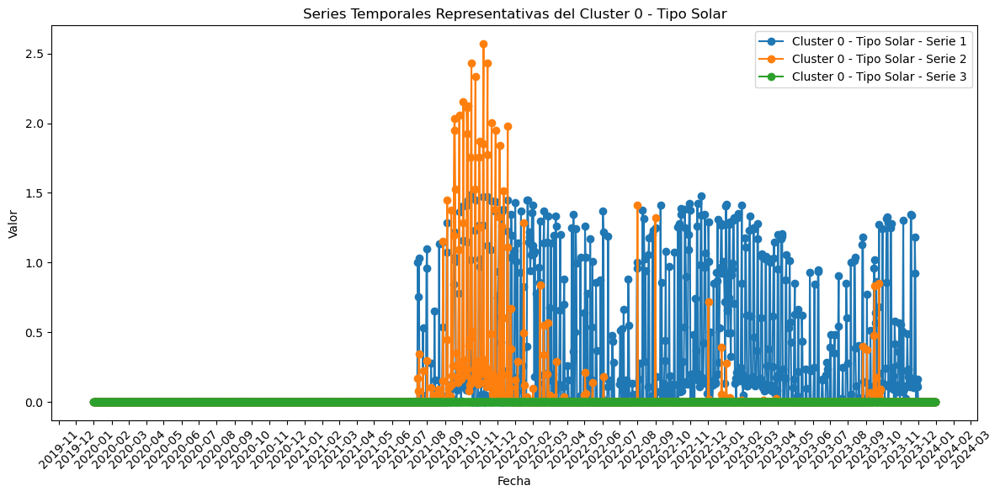

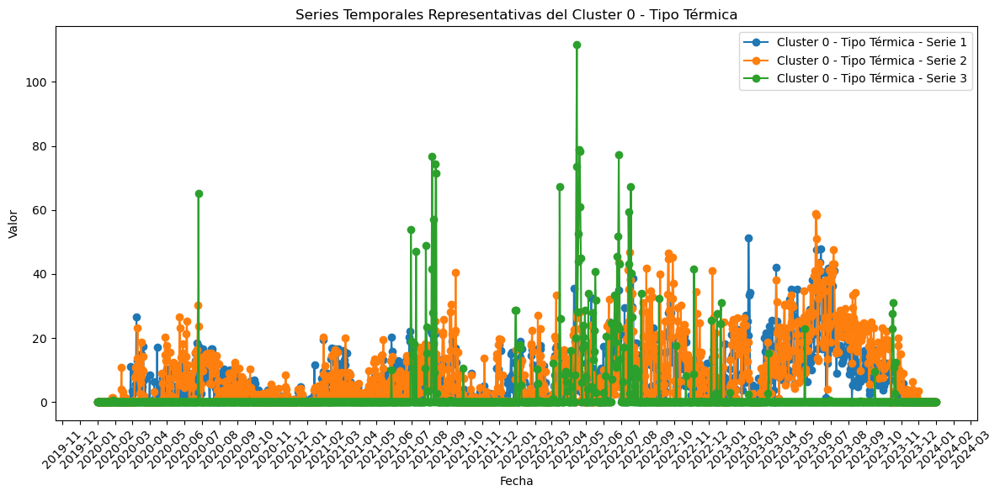

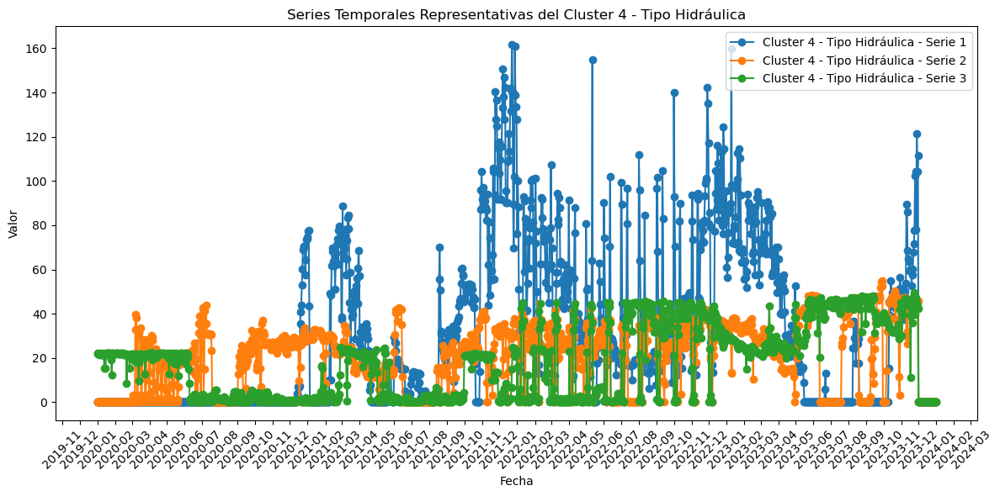

...

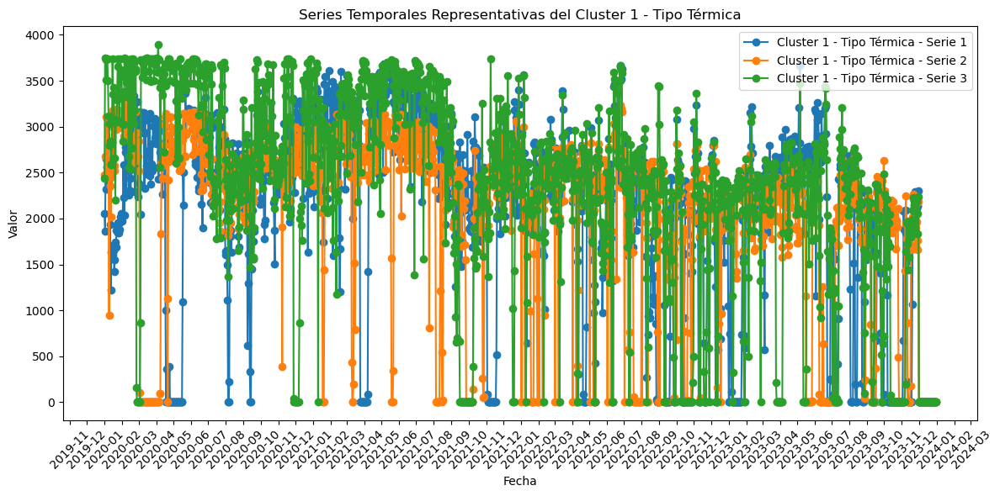

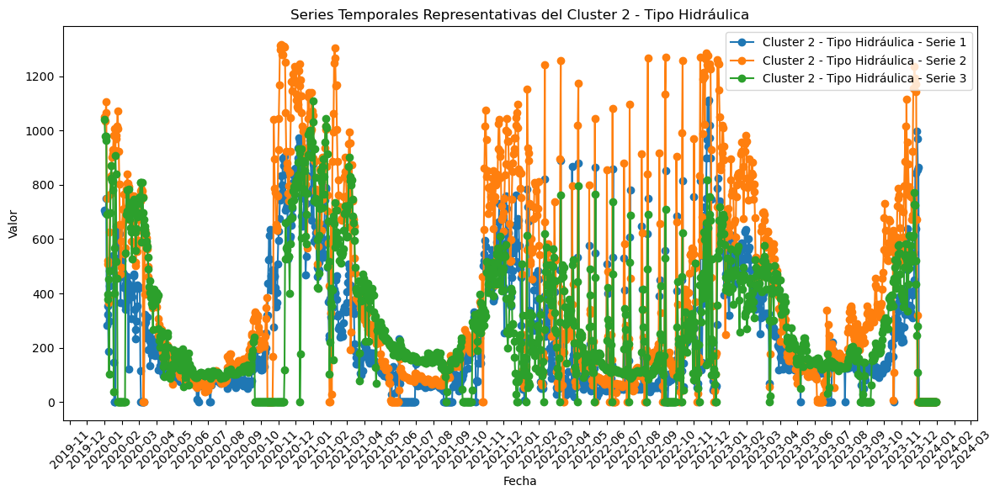

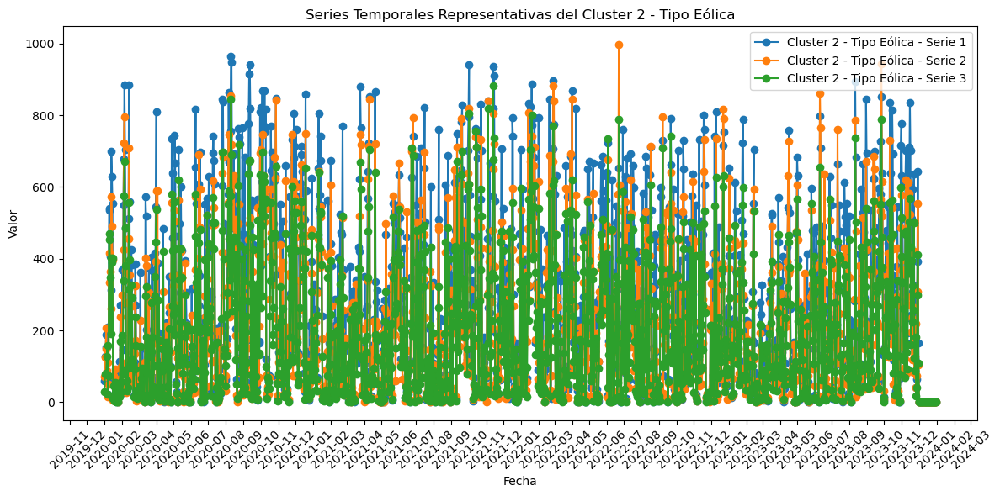

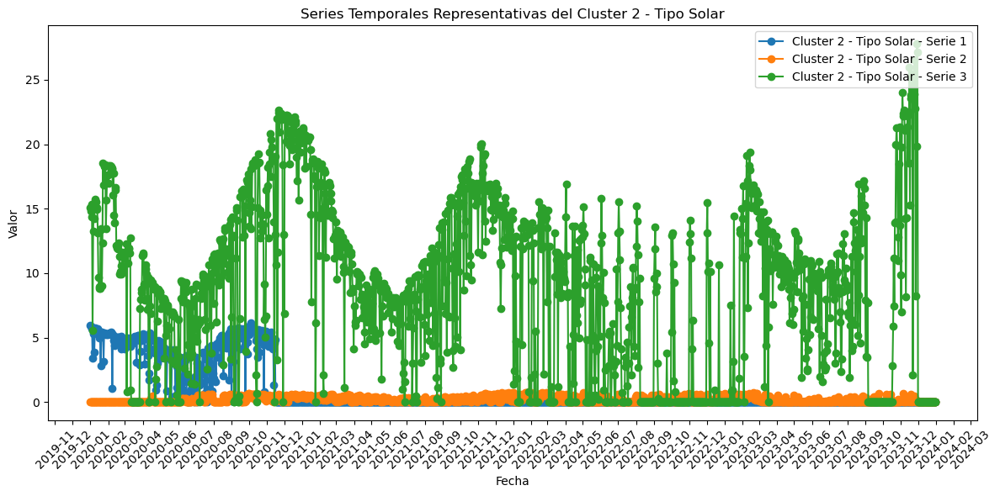

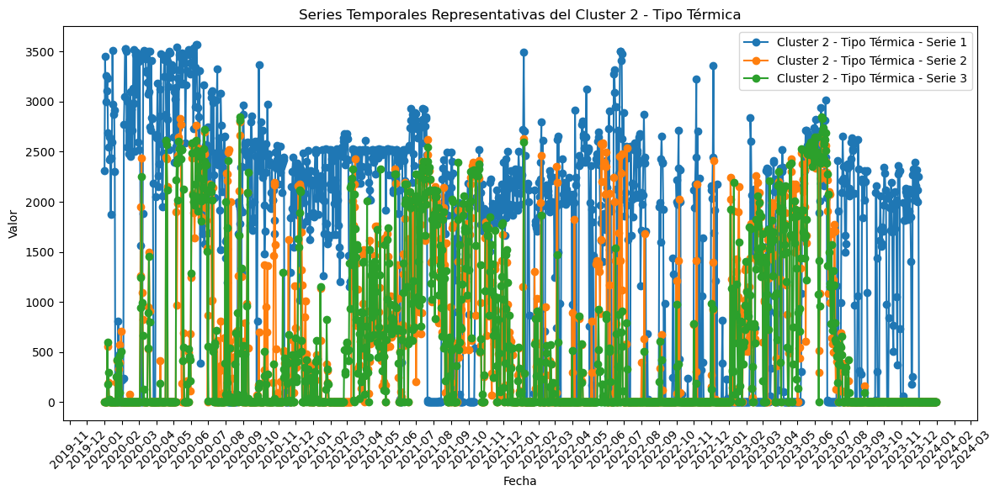

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from tslearn.preprocessing import TimeSeriesScalerMinMax
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import pairwise_distances
import time

# Agrupar por fecha y llave, y sumar la columna 'TOTAL'
energia_por_fecha = df.groupby(['LLAVE NOMBRE', 'FECHA'])['TOTAL'].sum().reset_index()

# Pivotar los datos para tener fechas como columnas y llaves como filas
pivot_df = energia_por_fecha.pivot(index='LLAVE NOMBRE', columns='FECHA', values='TOTAL').fillna(0)

# Convertir las columnas de fecha a datetime
pivot_df.columns = pd.to_datetime(pivot_df.columns)

# Añadir la columna de nombres de generadoras al DataFrame
pivot_df['LLAVE NOMBRE'] = pivot_df.index

# Muestreo: seleccionar una fracción aleatoria de los datos (por ejemplo, el 10%)
sample_df = pivot_df.sample(frac=1, random_state=0)  # Ajusta la fracción según sea necesario

# Convertir el DataFrame muestreado a un formato adecuado
data = sample_df.drop(columns=['LLAVE NOMBRE']).values

# Normalización específica de series temporales
data_normalized = TimeSeriesScalerMinMax().fit_transform(data.reshape((data.shape[0], data.shape[1], 1)))

# Empezar el cronómetro
start_time = time.time()

# Aplicar K-means usando la métrica euclidiana
n_clusters = 6  # Ajusta el número de clusters según sea necesario
model = TimeSeriesKMeans(n_clusters=n_clusters, metric="euclidean", random_state=0)
labels = model.fit_predict(data_normalized)

# Añadir los resultados al DataFrame muestreado
sample_df['Cluster'] = labels

# Reordenar las columnas para mantener 'LLAVE NOMBRE' al principio
sample_df = sample_df[['LLAVE NOMBRE', 'Cluster'] + [col for col in sample_df.columns if col not in ['LLAVE NOMBRE', 'Cluster']]]

# Calcular la matriz de distancias euclidianas
distances = pairwise_distances(data_normalized.reshape(data_normalized.shape[0], data_normalized.shape[1]))

# Calcular el índice de Silueta usando la métrica euclidiana
silhouette_avg = silhouette_score(distances, labels, metric='euclidean')

# Detener el cronómetro
end_time = time.time()

# Calcular el tiempo de ejecución
execution_time = end_time - start_time

# Imprimir los resultados
print(f"Tiempo de ejecución: {execution_time:.2f} segundos")
print(f"Tiempo de ejecución: {execution_time / 60:.2f} minutos")
print(f"Índice de Silueta: {silhouette_avg:.2f}")

# Limpiar las columnas de `pivot_df` asegurándose de que sean fechas
pivot_df.columns = pd.to_datetime(pivot_df.columns, errors='coerce')

# Eliminar columnas que no se pudieron convertir a fechas
pivot_df = pivot_df.loc[:, pivot_df.columns.notna()]

# Obtener la lista de clusters únicos
clusters = sample_df['Cluster'].unique()

# Crear un DataFrame con la columna 'LLAVE NOMBRE' y 'TIPO' de df
tipo_df = df[['LLAVE NOMBRE', 'TIPO']].drop_duplicates()

# Crear un diccionario para almacenar los totales y proporciones de tipos por cluster
totales_cluster = {}
porcentaje_tipo_total = {}

# Inicializar un DataFrame para acumular el total de cada tipo
total_tipos_df = tipo_df['TIPO'].value_counts().to_frame(name='Total').reset_index()
total_tipos_df.columns = ['TIPO', 'Total']

# Iterar sobre cada cluster para calcular los totales y proporciones
for cluster in clusters:
    # Filtrar los datos del cluster
    cluster_data = sample_df[sample_df['Cluster'] == cluster]
    
    # Obtener la lista de generadoras en el cluster
    generadoras = cluster_data['LLAVE NOMBRE'].unique()
    
    # Obtener el tipo correspondiente para cada generadora
    tipos = tipo_df[tipo_df['LLAVE NOMBRE'].isin(generadoras)]
    
    # Contar las ocurrencias de cada tipo
    tipo_counts = tipos['TIPO'].value_counts()
    
    # Guardar el total de generadoras en el cluster
    total_cluster = tipo_counts.sum()
    totales_cluster[cluster] = total_cluster
    
    # Calcular el porcentaje de cada tipo dentro del cluster y agregar el conteo
    tipo_porcentaje_y_cantidad = tipo_counts.to_frame(name='Cantidad')
    tipo_porcentaje_y_cantidad['Porcentaje'] = (tipo_counts / total_cluster) * 100
    
    # Almacenar los porcentajes y cantidades en el diccionario
    porcentaje_tipo_total[cluster] = tipo_porcentaje_y_cantidad

# Mostrar los resultados totales por tipo y por cluster
print("Proporción total de cada tipo de generadora:")
print(total_tipos_df)
print()

print("Totales, cantidades y porcentajes de cada cluster:")
for cluster, total in totales_cluster.items():
    print(f"Cluster {cluster} - Total generadoras: {total}")
    print(f"Cantidad y porcentaje por tipo en el cluster {cluster}:")
    print(porcentaje_tipo_total[cluster])
    print()  # Línea en blanco para mayor legibilidad

# Calcular las series más cercanas al centroide para cada tipo dentro de cada cluster
for cluster in clusters:
    # Filtrar los datos del cluster
    cluster_data = sample_df[sample_df['Cluster'] == cluster]
    
    # Obtener la lista de generadoras en el cluster
    generadoras = cluster_data['LLAVE NOMBRE'].unique()
    
    # Filtrar las series temporales de las generadoras en el cluster
    cluster_series = pivot_df.loc[generadoras]
    
    # Obtener los tipos de energía en el cluster
    tipos_en_cluster = tipo_df[tipo_df['LLAVE NOMBRE'].isin(generadoras)]
    
    # Iterar sobre cada tipo de energía en el cluster
    for tipo in tipos_en_cluster['TIPO'].unique():
        # Filtrar las series temporales del tipo de energía actual
        series_tipo = cluster_series.loc[tipos_en_cluster[tipos_en_cluster['TIPO'] == tipo]['LLAVE NOMBRE']]
        
        if not series_tipo.empty:
            # Calcular el centroide (media) del tipo de energía
            centroide = series_tipo.mean(axis=0)
            
            # Calcular la distancia entre cada serie temporal y el centroide usando la distancia euclidiana
            distancias = np.array([np.linalg.norm(centroide.values - serie.values) for index, serie in series_tipo.iterrows()]).reshape(-1, 1)
            
            # Encontrar las 3 series más cercanas al centroide
            indices_mas_cercanas = np.argsort(distancias, axis=0)[:3].flatten()
            series_representativas = series_tipo.iloc[indices_mas_cercanas]
            
            # Graficar las 3 series temporales representativas
            fig, ax = plt.subplots(figsize=(12, 6))
            for j, (index, serie) in enumerate(series_representativas.iterrows()):
                ax.plot(pivot_df.columns, serie, label=f'Cluster {cluster} - Tipo {tipo} - Serie {j+1}', linestyle='-', marker='o')
            
            # Configuración del gráfico
            ax.set_title(f'Series Temporales Representativas del Cluster {cluster} - Tipo {tipo}')
            ax.set_xlabel('Fecha')
            ax.set_ylabel('Valor')
            ax.xaxis.set_major_locator(mdates.MonthLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
            ax.tick_params(axis='x', rotation=45)
            ax.legend(loc='upper right')

            plt.tight_layout()
            plt.show()


Tiempo de ejecución: 0.88 segundos
Tiempo de ejecución: 0.01 minutos
Índice de Silueta: 0.41


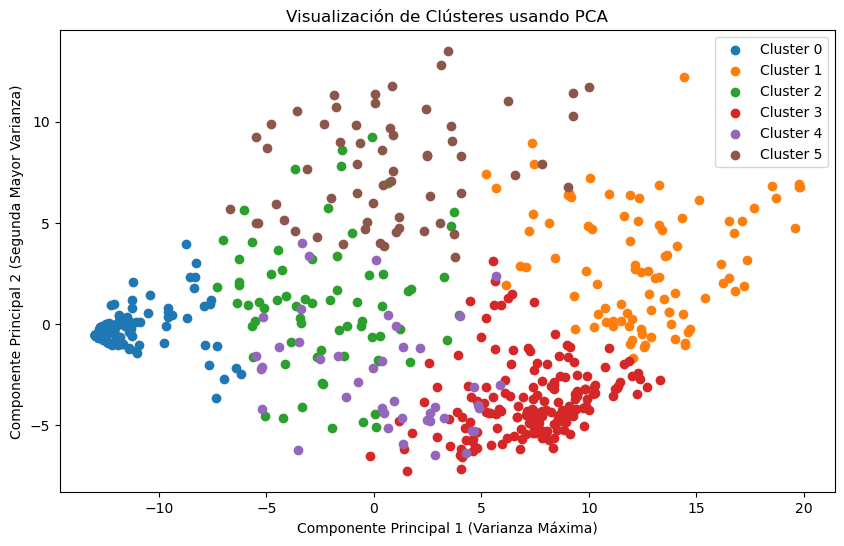

C:\Users\JMezaV\anaconda3\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


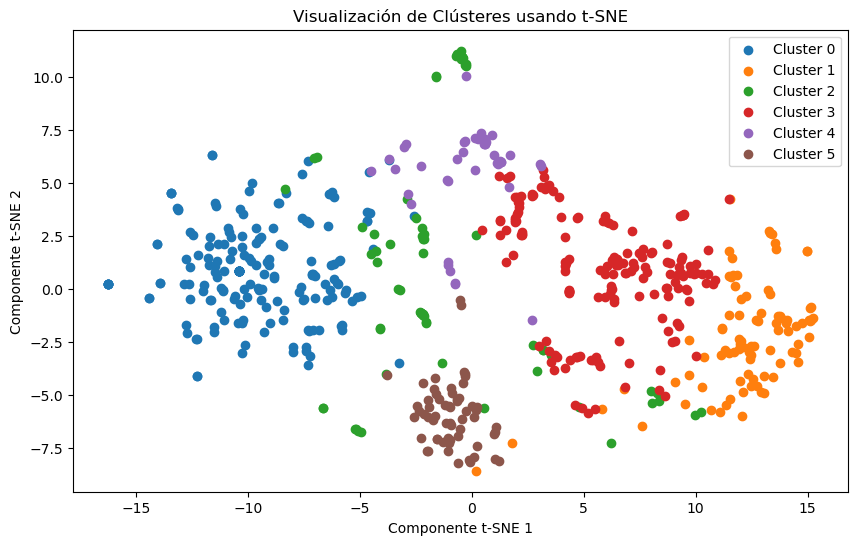

Proporción total de cada tipo de generadora:
         TIPO  Total
0       Solar    222
1     Térmica    215
2  Hidráulica    152
3      Eólica     34

Totales, cantidades y porcentajes de cada cluster:
Cluster 0 - Total generadoras: 191
Cantidad y porcentaje por tipo en el cluster 0:
            Cantidad  Porcentaje
Térmica          167   87.434555
Hidráulica        16    8.376963
Solar              7    3.664921
Eólica             1    0.523560

Cluster 4 - Total generadoras: 43
Cantidad y porcentaje por tipo en el cluster 4:
            Cantidad  Porcentaje
Solar             27   62.790698
Hidráulica         9   20.930233
Térmica            6   13.953488
Eólica             1    2.325581

Cluster 5 - Total generadoras: 60
Cantidad y porcentaje por tipo en el cluster 5:
            Cantidad  Porcentaje
Hidráulica        59   98.333333
Térmica            1    1.666667

Cluster 3 - Total generadoras: 168
Cantidad y porcentaje por tipo en el cluster 3:
            Cantidad  Porcentaje
Sol

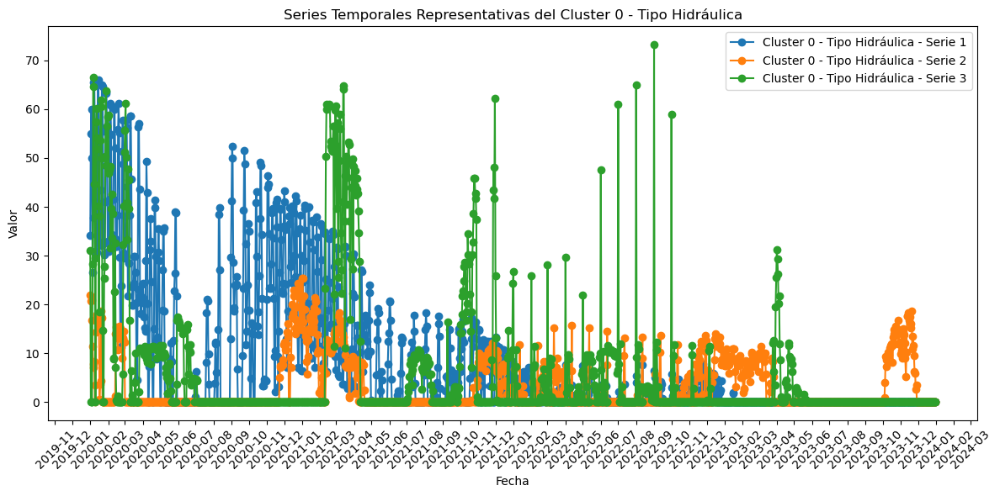

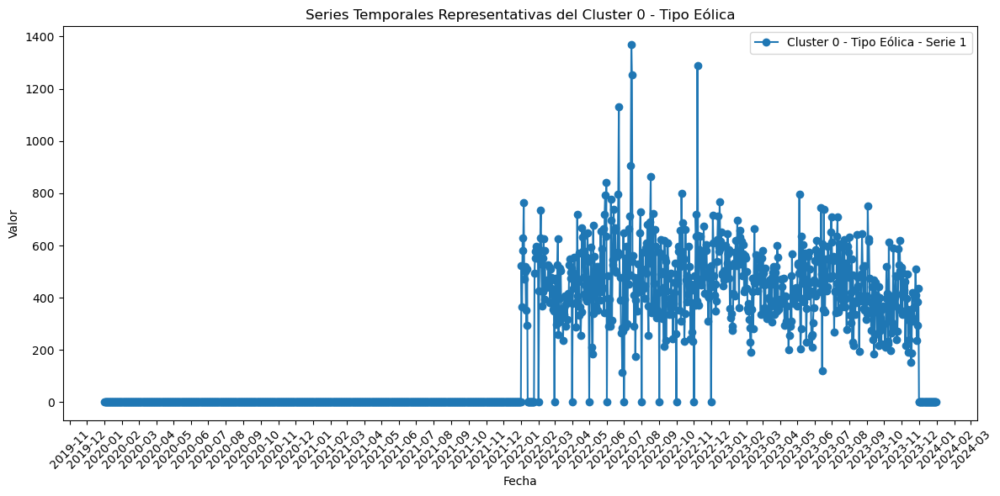

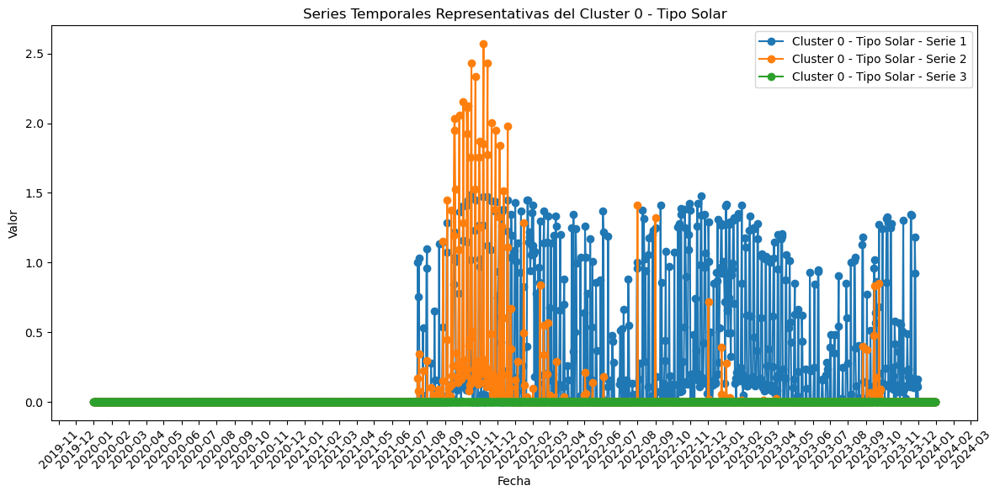

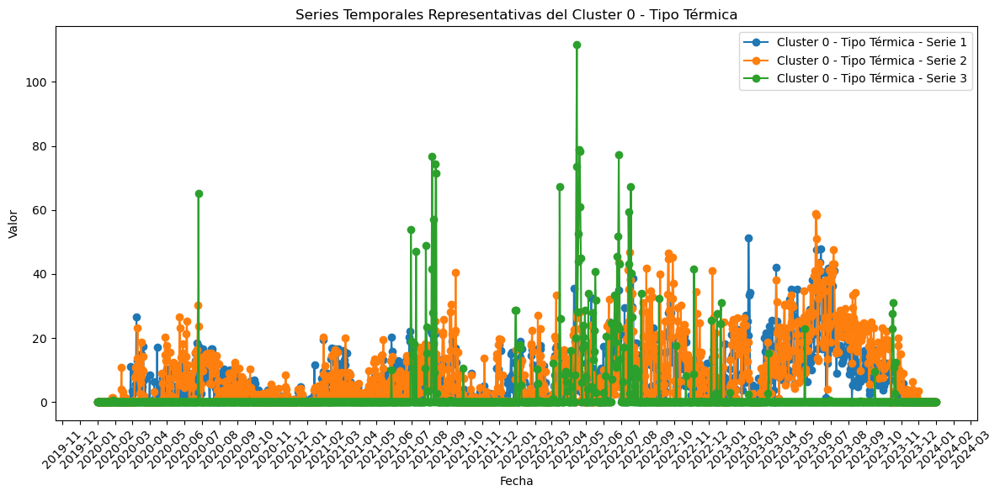

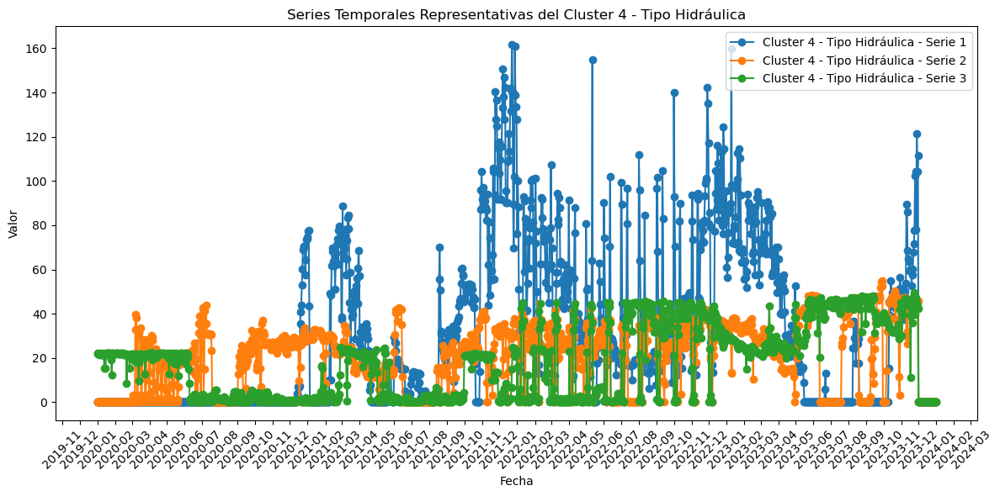

...

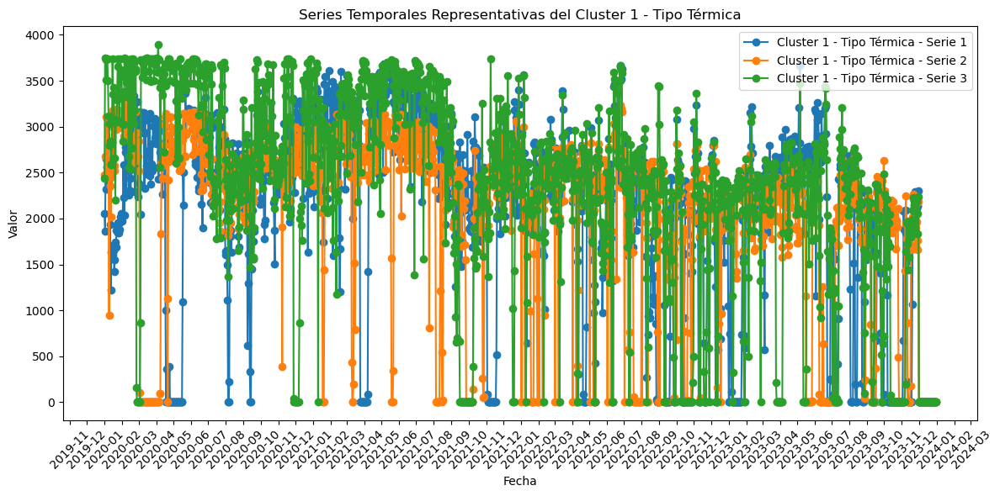

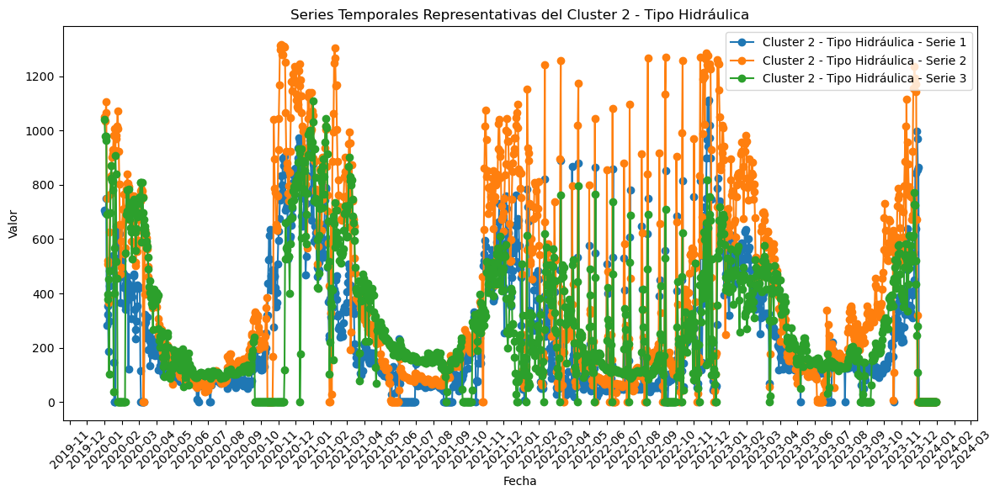

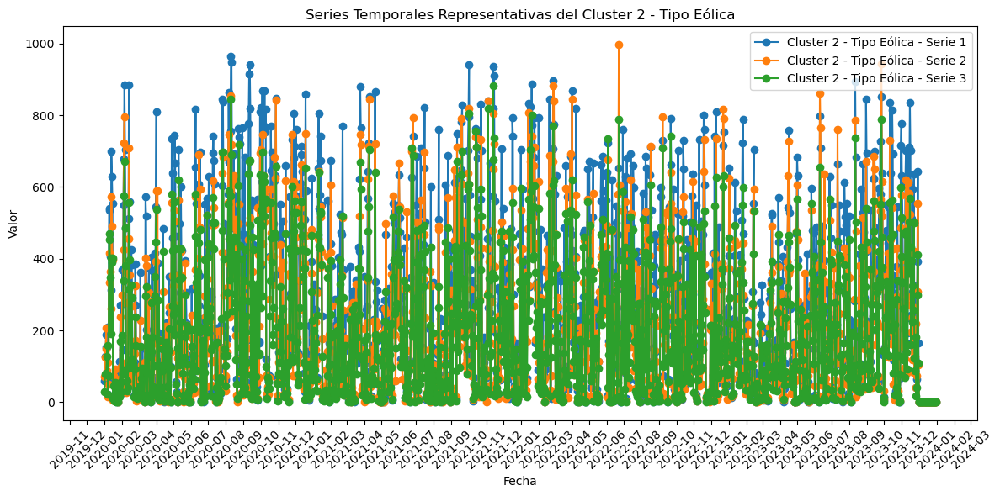

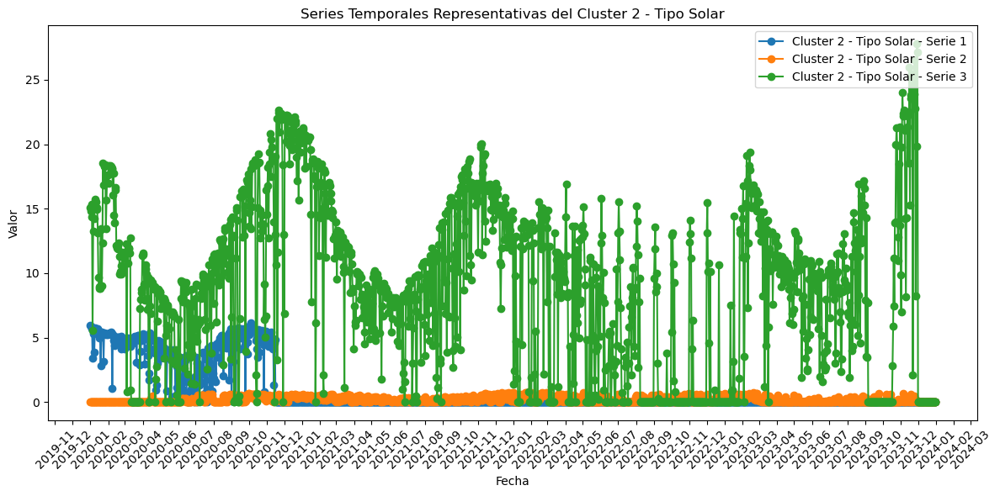

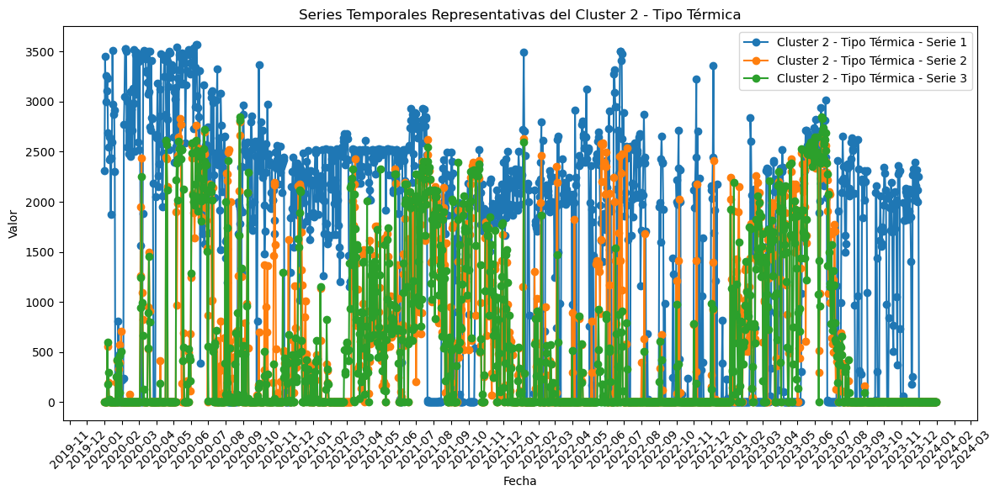

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from tslearn.preprocessing import TimeSeriesScalerMinMax
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import pairwise_distances
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import time

# Agrupar por fecha y llave, y sumar la columna 'TOTAL'
energia_por_fecha = df.groupby(['LLAVE NOMBRE', 'FECHA'])['TOTAL'].sum().reset_index()

# Pivotar los datos para tener fechas como columnas y llaves como filas
pivot_df = energia_por_fecha.pivot(index='LLAVE NOMBRE', columns='FECHA', values='TOTAL').fillna(0)

# Convertir las columnas de fecha a datetime
pivot_df.columns = pd.to_datetime(pivot_df.columns)

# Añadir la columna de nombres de generadoras al DataFrame
pivot_df['LLAVE NOMBRE'] = pivot_df.index

# Muestreo: seleccionar una fracción aleatoria de los datos (por ejemplo, el 10%)
sample_df = pivot_df.sample(frac=1, random_state=0)  # Ajusta la fracción según sea necesario

# Convertir el DataFrame muestreado a un formato adecuado
data = sample_df.drop(columns=['LLAVE NOMBRE']).values

# Normalización específica de series temporales
data_normalized = TimeSeriesScalerMinMax().fit_transform(data.reshape((data.shape[0], data.shape[1], 1)))

# Empezar el cronómetro
start_time = time.time()

# Aplicar K-means usando la métrica euclidiana
n_clusters = 6  # Ajusta el número de clusters según sea necesario
model = TimeSeriesKMeans(n_clusters=n_clusters, metric="euclidean", random_state=0)
labels = model.fit_predict(data_normalized)

# Añadir los resultados al DataFrame muestreado
sample_df['Cluster'] = labels

# Reordenar las columnas para mantener 'LLAVE NOMBRE' al principio
sample_df = sample_df[['LLAVE NOMBRE', 'Cluster'] + [col for col in sample_df.columns if col not in ['LLAVE NOMBRE', 'Cluster']]]

# Calcular la matriz de distancias euclidianas
distances = pairwise_distances(data_normalized.reshape(data_normalized.shape[0], data_normalized.shape[1]))

# Calcular el índice de Silueta usando la métrica euclidiana
silhouette_avg = silhouette_score(distances, labels, metric='euclidean')

# Detener el cronómetro
end_time = time.time()

# Calcular el tiempo de ejecución
execution_time = end_time - start_time

# Imprimir los resultados
print(f"Tiempo de ejecución: {execution_time:.2f} segundos")
print(f"Tiempo de ejecución: {execution_time / 60:.2f} minutos")
print(f"Índice de Silueta: {silhouette_avg:.2f}")

# Visualización de los clústeres usando PCA
data_reshaped = data_normalized.reshape(data_normalized.shape[0], -1)  # Convertir a 2D para PCA y t-SNE
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_reshaped)

plt.figure(figsize=(10, 6))
for cluster in np.unique(labels):
    plt.scatter(data_pca[labels == cluster, 0], data_pca[labels == cluster, 1], label=f'Cluster {cluster}')
plt.title("Visualización de Clústeres usando PCA")
plt.xlabel("Componente Principal 1 (Varianza Máxima)")
plt.ylabel("Componente Principal 2 (Segunda Mayor Varianza)")
plt.legend()
plt.show()

# Visualización de los clústeres usando t-SNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=300, random_state=0)
data_tsne = tsne.fit_transform(data_reshaped)

plt.figure(figsize=(10, 6))
for cluster in np.unique(labels):
    plt.scatter(data_tsne[labels == cluster, 0], data_tsne[labels == cluster, 1], label=f'Cluster {cluster}')
plt.title("Visualización de Clústeres usando t-SNE")
plt.xlabel("Componente t-SNE 1")
plt.ylabel("Componente t-SNE 2")
plt.legend()
plt.show()

# Limpiar las columnas de `pivot_df` asegurándose de que sean fechas
pivot_df.columns = pd.to_datetime(pivot_df.columns, errors='coerce')
pivot_df = pivot_df.loc[:, pivot_df.columns.notna()]

# Obtener la lista de clusters únicos
clusters = sample_df['Cluster'].unique()

# Crear un DataFrame con la columna 'LLAVE NOMBRE' y 'TIPO' de df
tipo_df = df[['LLAVE NOMBRE', 'TIPO']].drop_duplicates()

# Crear un diccionario para almacenar los totales y proporciones de tipos por cluster
totales_cluster = {}
porcentaje_tipo_total = {}

# Inicializar un DataFrame para acumular el total de cada tipo
total_tipos_df = tipo_df['TIPO'].value_counts().to_frame(name='Total').reset_index()
total_tipos_df.columns = ['TIPO', 'Total']

# Iterar sobre cada cluster para calcular los totales y proporciones
for cluster in clusters:
    # Filtrar los datos del cluster
    cluster_data = sample_df[sample_df['Cluster'] == cluster]
    
    # Obtener la lista de generadoras en el cluster
    generadoras = cluster_data['LLAVE NOMBRE'].unique()
    
    # Obtener el tipo correspondiente para cada generadora
    tipos = tipo_df[tipo_df['LLAVE NOMBRE'].isin(generadoras)]
    
    # Contar las ocurrencias de cada tipo
    tipo_counts = tipos['TIPO'].value_counts()
    
    # Guardar el total de generadoras en el cluster
    total_cluster = tipo_counts.sum()
    totales_cluster[cluster] = total_cluster
    
    # Calcular el porcentaje de cada tipo dentro del cluster y agregar el conteo
    tipo_porcentaje_y_cantidad = tipo_counts.to_frame(name='Cantidad')
    tipo_porcentaje_y_cantidad['Porcentaje'] = (tipo_counts / total_cluster) * 100
    
    # Almacenar los porcentajes y cantidades en el diccionario
    porcentaje_tipo_total[cluster] = tipo_porcentaje_y_cantidad

# Mostrar los resultados totales por tipo y por cluster
print("Proporción total de cada tipo de generadora:")
print(total_tipos_df)
print()

print("Totales, cantidades y porcentajes de cada cluster:")
for cluster, total in totales_cluster.items():
    print(f"Cluster {cluster} - Total generadoras: {total}")
    print(f"Cantidad y porcentaje por tipo en el cluster {cluster}:")
    print(porcentaje_tipo_total[cluster])
    print()  # Línea en blanco para mayor legibilidad

# Calcular las series más cercanas al centroide para cada tipo dentro de cada cluster
for cluster in clusters:
    # Filtrar los datos del cluster
    cluster_data = sample_df[sample_df['Cluster'] == cluster]
    
    # Obtener la lista de generadoras en el cluster
    generadoras = cluster_data['LLAVE NOMBRE'].unique()
    
    # Filtrar las series temporales de las generadoras en el cluster
    cluster_series = pivot_df.loc[generadoras]
    
    # Obtener los tipos de energía en el cluster
    tipos_en_cluster = tipo_df[tipo_df['LLAVE NOMBRE'].isin(generadoras)]
    
    # Iterar sobre cada tipo de energía en el cluster
    for tipo in tipos_en_cluster['TIPO'].unique():
        # Filtrar las series temporales del tipo de energía actual
        series_tipo = cluster_series.loc[tipos_en_cluster[tipos_en_cluster['TIPO'] == tipo]['LLAVE NOMBRE']]
        
        if not series_tipo.empty:
            # Calcular el centroide (media) del tipo de energía
            centroide = series_tipo.mean(axis=0)
            
            # Calcular la distancia entre cada serie temporal y el centroide usando la distancia euclidiana
            distancias = np.array([np.linalg.norm(centroide.values - serie.values) for index, serie in series_tipo.iterrows()]).reshape(-1, 1)
            
            # Encontrar las 3 series más cercanas al centroide
            indices_mas_cercanas = np.argsort(distancias, axis=0)[:3].flatten()
            series_representativas = series_tipo.iloc[indices_mas_cercanas]
            
            # Graficar las 3 series temporales representativas
            fig, ax = plt.subplots(figsize=(12, 6))
            for j, (index, serie) in enumerate(series_representativas.iterrows()):
                ax.plot(pivot_df.columns, serie, label=f'Cluster {cluster} - Tipo {tipo} - Serie {j+1}', linestyle='-', marker='o')
            
            # Configuración del gráfico
            ax.set_title(f'Series Temporales Representativas del Cluster {cluster} - Tipo {tipo}')
            ax.set_xlabel('Fecha')
            ax.set_ylabel('Valor')
            ax.xaxis.set_major_locator(mdates.MonthLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
            ax.tick_params(axis='x', rotation=45)
            ax.legend(loc='upper right')

            plt.tight_layout()
            plt.show()


In [26]:
# Crear un DataFrame con la columna 'LLAVE NOMBRE' y 'REGIÓN' de df
region_df = df[['LLAVE NOMBRE', 'REGIÓN']].drop_duplicates()

# Crear un diccionario para almacenar los totales y proporciones de regiones por cluster
totales_cluster_region = {}
porcentaje_region_total = {}

# Inicializar un DataFrame para acumular el total de cada región
total_regiones_df = region_df['REGIÓN'].value_counts().to_frame(name='Total').reset_index()
total_regiones_df.columns = ['REGIÓN', 'Total']

# Iterar sobre cada cluster para calcular los totales y proporciones
for cluster in clusters:
    # Filtrar los datos del cluster
    cluster_data = sample_df[sample_df['Cluster'] == cluster]
    
    # Obtener la lista de generadoras en el cluster
    generadoras = cluster_data['LLAVE NOMBRE'].unique()
    
    # Obtener la región correspondiente para cada generadora
    regiones = region_df[region_df['LLAVE NOMBRE'].isin(generadoras)]
    
    # Contar las ocurrencias de cada región
    region_counts = regiones['REGIÓN'].value_counts()
    
    # Guardar el total de generadoras en el cluster
    total_cluster = region_counts.sum()
    totales_cluster_region[cluster] = total_cluster
    
    # Calcular el porcentaje de cada región dentro del cluster y agregar el conteo
    region_porcentaje_y_cantidad = region_counts.to_frame(name='Cantidad')
    region_porcentaje_y_cantidad['Porcentaje'] = (region_counts / total_cluster) * 100
    
    # Almacenar los porcentajes y cantidades en el diccionario
    porcentaje_region_total[cluster] = region_porcentaje_y_cantidad

# Mostrar los resultados totales por región y por cluster
print("Proporción total de cada región de generadora:")
print(total_regiones_df)
print()

print("Totales, cantidades y porcentajes de cada cluster por región:")
for cluster, total in totales_cluster_region.items():
    print(f"Cluster {cluster} - Total generadoras: {total}")
    print(f"Cantidad y porcentaje por región en el cluster {cluster}:")
    print(porcentaje_region_total[cluster])
    print()  # Línea en blanco para mayor legibilidad

Proporción total de cada región de generadora:
                    REGIÓN  Total
0     Región de Valparaíso     89
1       Región del Bío-Bío     81
2     Región Metropolitana     78
3      Región de O'Higgins     71
4         Región del Maule     60
5        Región de Atacama     52
6       Región de Coquimbo     50
7      Región de los Lagos     33
8   Región de la Araucanía     27
9    Región de Antofagasta     27
10      Región de los Ríos     24
11         Región de Ñuble     14
12      Región de Tarapacá     13
13      Arica y Parinacota      4

Totales, cantidades y porcentajes de cada cluster por región:
Cluster 0 - Total generadoras: 191
Cantidad y porcentaje por región en el cluster 0:
                        Cantidad  Porcentaje
Región del Bío-Bío            33   17.277487
Región de Valparaíso          30   15.706806
Región de Atacama             23   12.041885
Región Metropolitana          20   10.471204
Región de los Lagos           17    8.900524
Región de O'Higgins      

In [25]:
# Crear un DataFrame con las columnas 'LLAVE NOMBRE', 'REGIÓN' y 'TIPO' de df, eliminando duplicados
region_tipo_df = df[['LLAVE NOMBRE', 'REGIÓN', 'TIPO']].drop_duplicates()

# Diccionario para almacenar los totales y proporciones de tipos por región y cluster
totales_cluster_region_tipo = {}

# Inicializar un DataFrame para acumular el total de cada región y tipo
total_regiones_df = region_tipo_df.groupby(['REGIÓN', 'TIPO']).size().to_frame(name='Total').reset_index()

# Iterar sobre cada cluster para calcular los totales y proporciones por región y tipo
for cluster in clusters:
    # Filtrar los datos del cluster
    cluster_data = sample_df[sample_df['Cluster'] == cluster]
    
    # Obtener la lista de generadoras en el cluster
    generadoras = cluster_data['LLAVE NOMBRE'].unique()
    
    # Obtener la región y tipo correspondiente para cada generadora
    regiones_tipos = region_tipo_df[region_tipo_df['LLAVE NOMBRE'].isin(generadoras)]
    
    # Contar las ocurrencias de cada combinación de región y tipo
    region_tipo_counts = regiones_tipos.groupby(['REGIÓN', 'TIPO']).size().to_frame(name='Cantidad').reset_index()
    
    # Guardar el total de generadoras en el cluster
    total_cluster = region_tipo_counts['Cantidad'].sum()
    
    # Calcular el porcentaje de cada combinación de región y tipo dentro del cluster
    region_tipo_counts['Porcentaje'] = (region_tipo_counts['Cantidad'] / total_cluster) * 100
    
    # Almacenar los resultados en el diccionario
    totales_cluster_region_tipo[cluster] = region_tipo_counts

# Mostrar los resultados totales por región y tipo en cada cluster
print("Totales, cantidades y porcentajes de cada combinación de región y tipo por cluster:")
for cluster, data in totales_cluster_region_tipo.items():
    print(f"Cluster {cluster} - Total generadoras:")
    print(data)
    print()  # Línea en blanco para mayor legibilidad

Totales, cantidades y porcentajes de cada combinación de región y tipo por cluster:
Cluster 0 - Total generadoras:
                    REGIÓN        TIPO  Cantidad  Porcentaje
0     Región Metropolitana  Hidráulica         2    1.047120
1     Región Metropolitana       Solar         2    1.047120
2     Región Metropolitana     Térmica        16    8.376963
3    Región de Antofagasta      Eólica         1    0.523560
4    Región de Antofagasta     Térmica        11    5.759162
5        Región de Atacama       Solar         2    1.047120
6        Región de Atacama     Térmica        21   10.994764
7       Región de Coquimbo  Hidráulica         1    0.523560
8       Región de Coquimbo     Térmica         9    4.712042
9      Región de O'Higgins  Hidráulica         4    2.094241
10     Región de O'Higgins     Térmica         8    4.188482
11      Región de Tarapacá       Solar         1    0.523560
12      Región de Tarapacá     Térmica         2    1.047120
13    Región de Valparaíso  Hid

# DTW

Tiempo de ejecución: 4737.20 segundos
Tiempo de ejecución: 78.95 minutos
Índice de Silueta: 0.26
Proporción total de cada tipo de generadora:
         TIPO  Total
0       Solar    222
1     Térmica    215
2  Hidráulica    152
3      Eólica     34

Totales, cantidades y porcentajes de cada cluster:
Cluster 1 - Total generadoras: 175
Cantidad y porcentaje por tipo en el cluster 1:
            Cantidad  Porcentaje
Térmica          155   88.571429
Hidráulica        14    8.000000
Solar              5    2.857143
Eólica             1    0.571429

Cluster 5 - Total generadoras: 95
Cantidad y porcentaje por tipo en el cluster 5:
            Cantidad  Porcentaje
Hidráulica        79   83.157895
Térmica           12   12.631579
Solar              4    4.210526

Cluster 3 - Total generadoras: 107
Cantidad y porcentaje por tipo en el cluster 3:
            Cantidad  Porcentaje
Solar            104   97.196262
Hidráulica         2    1.869159
Térmica            1    0.934579

Cluster 2 - Total gen

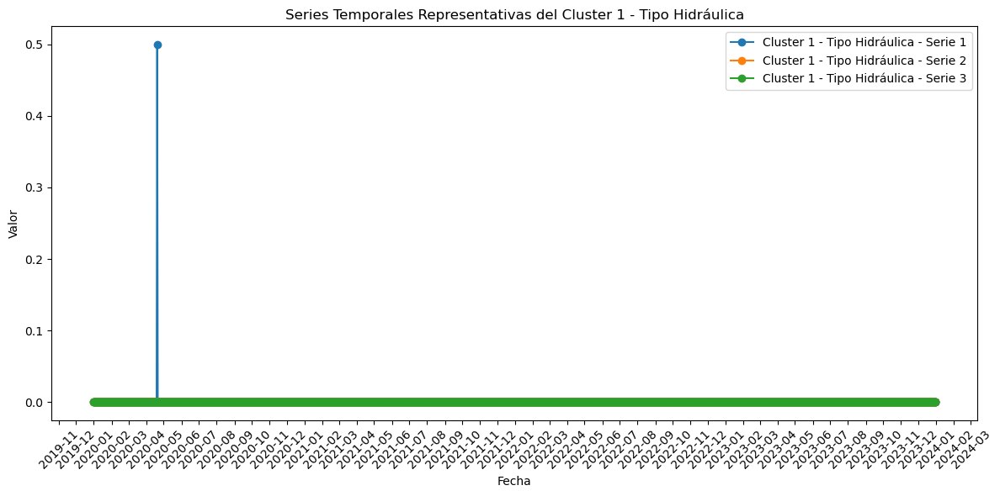

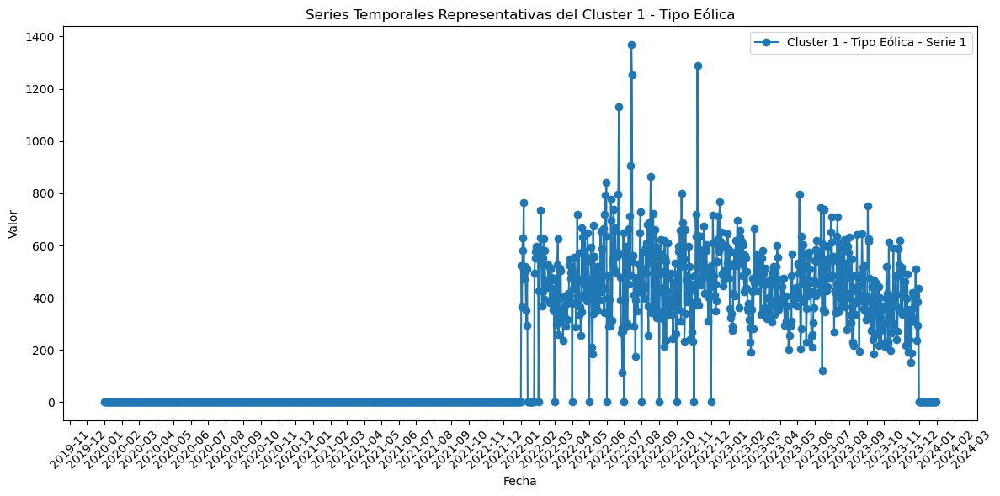

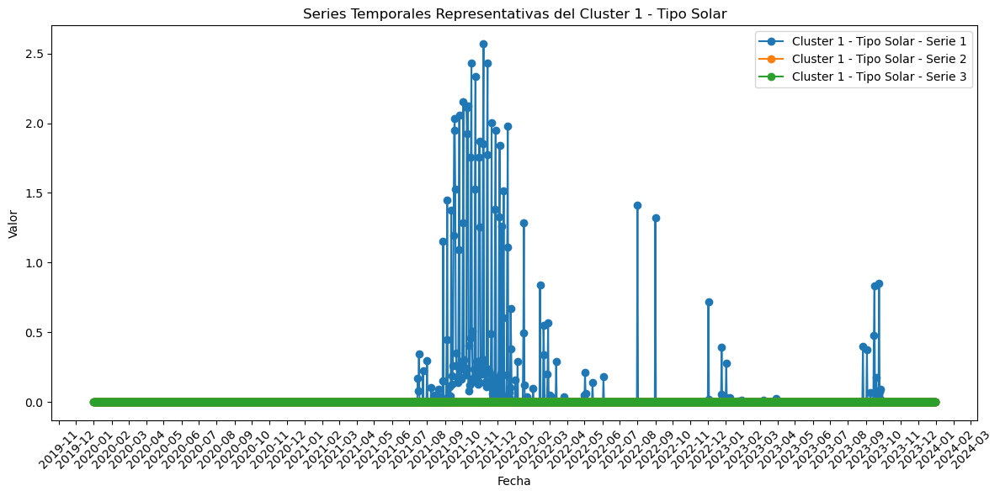

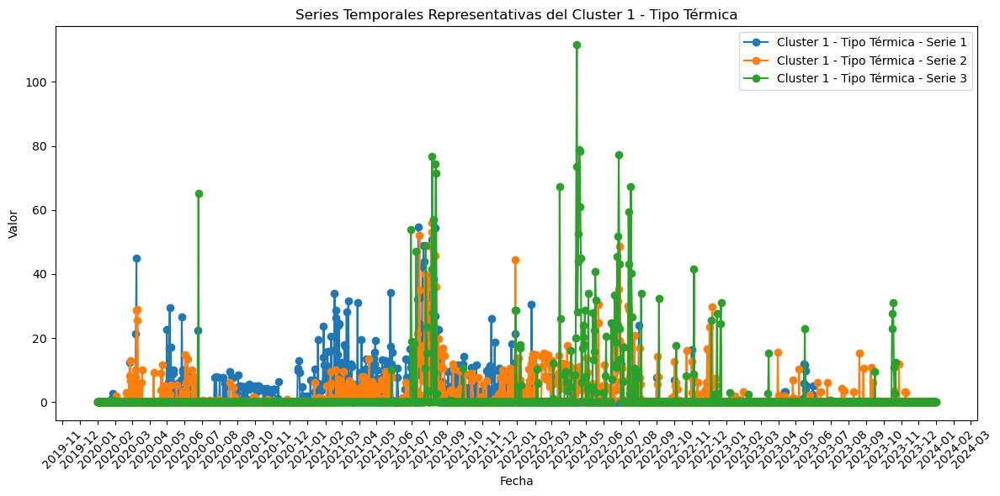

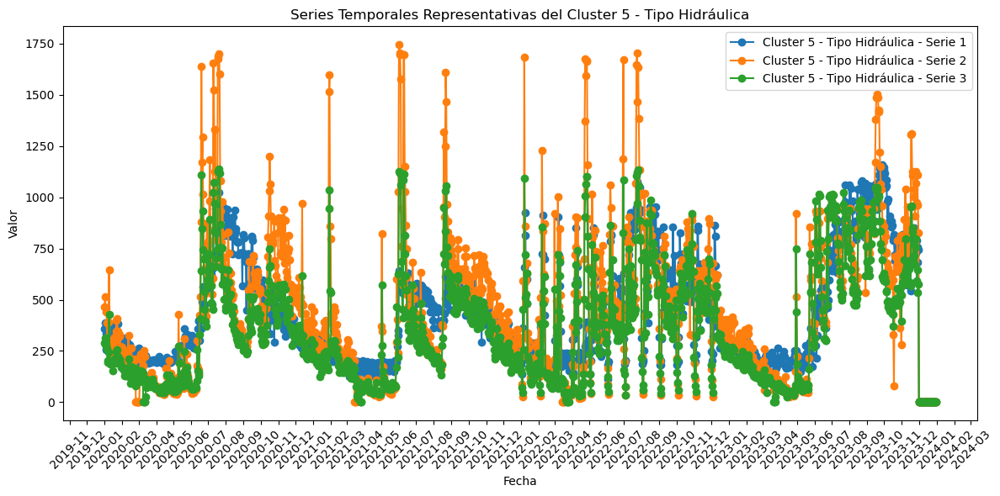

...

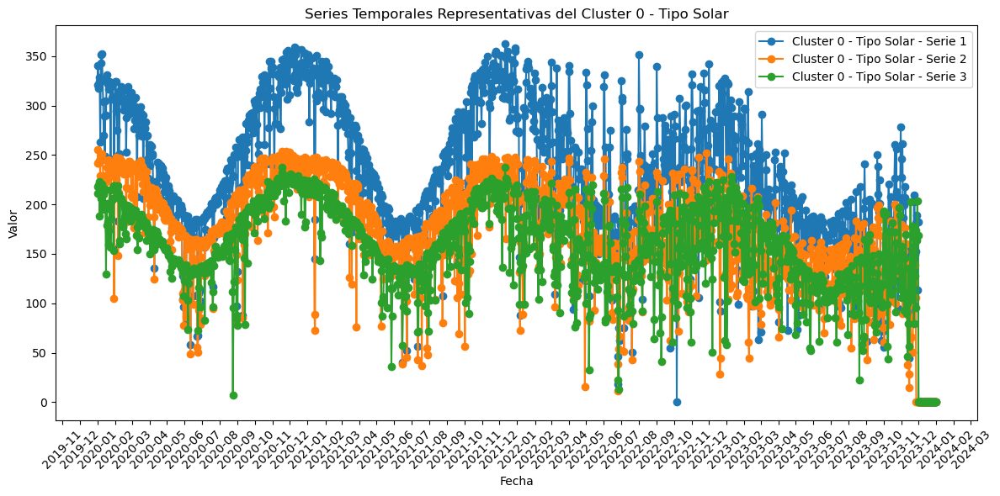

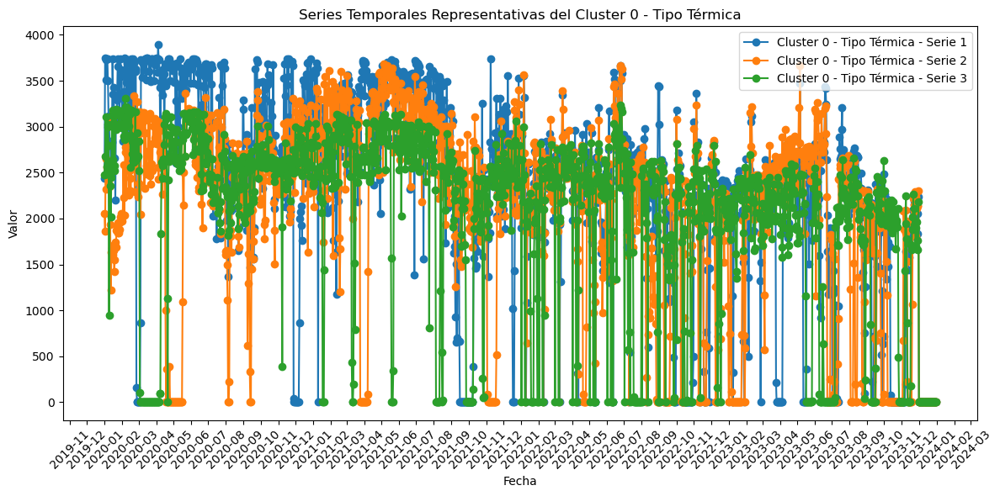

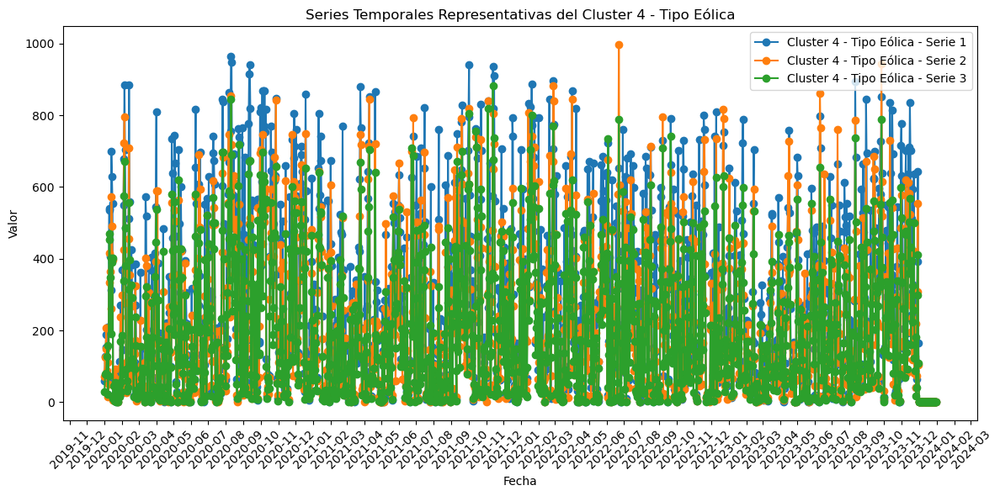

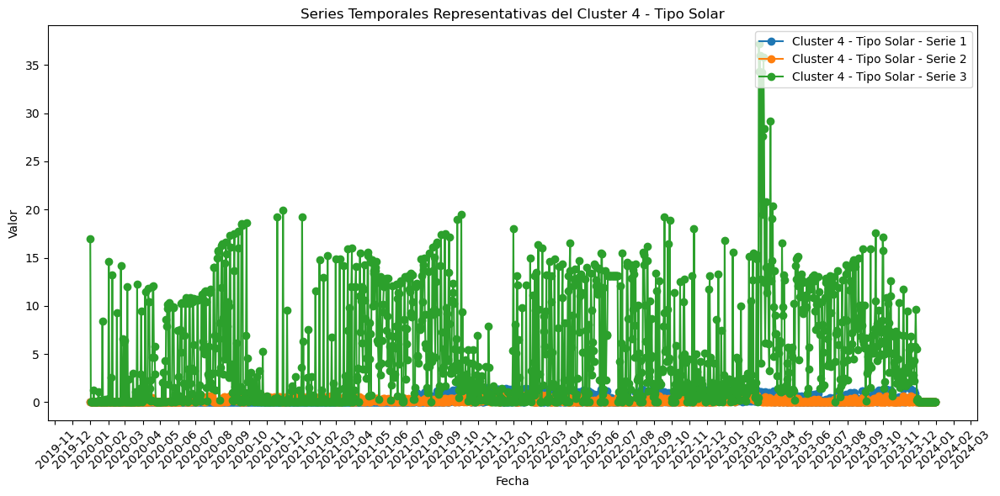

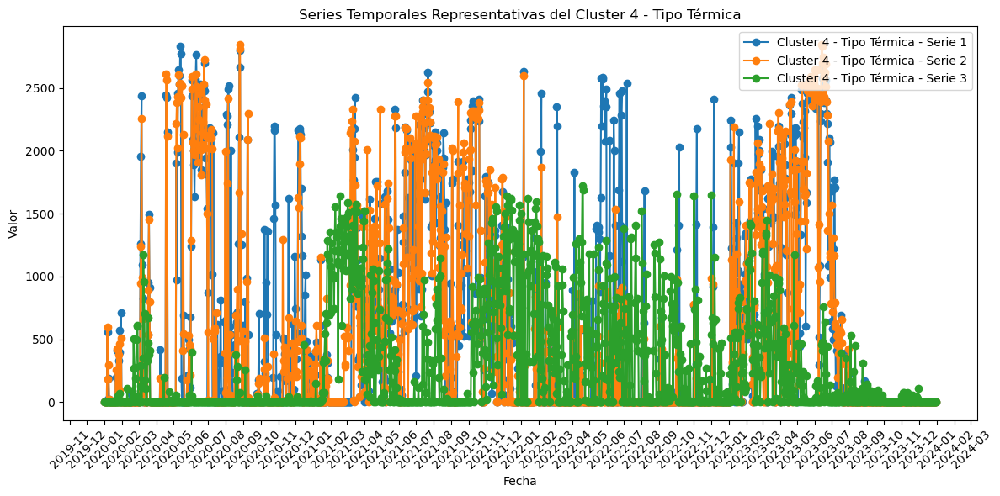

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from tslearn.preprocessing import TimeSeriesScalerMinMax
from tslearn.clustering import TimeSeriesKMeans
from tslearn.metrics import cdist_dtw
from sklearn.metrics import silhouette_score
import time

# Agrupar por fecha y llave, y sumar la columna 'TOTAL'
energia_por_fecha = df.groupby(['LLAVE NOMBRE', 'FECHA'])['TOTAL'].sum().reset_index()

# Pivotar los datos para tener fechas como columnas y llaves como filas
pivot_df = energia_por_fecha.pivot(index='LLAVE NOMBRE', columns='FECHA', values='TOTAL').fillna(0)

# Convertir las columnas de fecha a datetime
pivot_df.columns = pd.to_datetime(pivot_df.columns)

# Añadir la columna de nombres de generadoras al DataFrame
pivot_df['LLAVE NOMBRE'] = pivot_df.index

# Muestreo: seleccionar una fracción aleatoria de los datos (por ejemplo, el 10%)
sample_df = pivot_df.sample(frac=1, random_state=0)  # Ajusta la fracción según sea necesario

# Convertir el DataFrame muestreado a un formato adecuado para DTW
data = sample_df.drop(columns=['LLAVE NOMBRE']).values

# Normalización específica de series temporales
data_normalized = TimeSeriesScalerMinMax().fit_transform(data.reshape((data.shape[0], data.shape[1], 1)))

# Empezar el cronómetro
start_time = time.time()

# Aplicar K-means usando DTW
n_clusters = 6  # Ajusta el número de clusters según sea necesario
model = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", random_state=0)
labels = model.fit_predict(data_normalized)

# Añadir los resultados al DataFrame muestreado
sample_df['Cluster'] = labels

# Reordenar las columnas para mantener 'LLAVE NOMBRE' al principio
sample_df = sample_df[['LLAVE NOMBRE', 'Cluster'] + [col for col in sample_df.columns if col not in ['LLAVE NOMBRE', 'Cluster']]]

# Calcular la matriz de distancias DTW usando cdist_dtw de manera eficiente
distances = cdist_dtw(data_normalized)

# Asegurarse de que la diagonal de la matriz sea cero
np.fill_diagonal(distances, 0)

# Calcular el índice de Silueta usando la matriz precomputada
silhouette_avg = silhouette_score(distances, labels, metric='precomputed')

# Detener el cronómetro
end_time = time.time()

# Calcular el tiempo de ejecución
execution_time = end_time - start_time

# Imprimir los resultados
print(f"Tiempo de ejecución: {execution_time:.2f} segundos")
print(f"Tiempo de ejecución: {execution_time / 60:.2f} minutos")
print(f"Índice de Silueta: {silhouette_avg:.2f}")

# Limpiar las columnas de `pivot_df` asegurándose de que sean fechas
pivot_df.columns = pd.to_datetime(pivot_df.columns, errors='coerce')

# Eliminar columnas que no se pudieron convertir a fechas
pivot_df = pivot_df.loc[:, pivot_df.columns.notna()]

# Obtener la lista de clusters únicos
clusters = sample_df['Cluster'].unique()

# Crear un DataFrame con la columna 'LLAVE NOMBRE' y 'TIPO' de df
tipo_df = df[['LLAVE NOMBRE', 'TIPO']].drop_duplicates()

# Crear un diccionario para almacenar los totales y proporciones de tipos por cluster
totales_cluster = {}
porcentaje_tipo_total = {}

# Inicializar un DataFrame para acumular el total de cada tipo
total_tipos_df = tipo_df['TIPO'].value_counts().to_frame(name='Total').reset_index()
total_tipos_df.columns = ['TIPO', 'Total']

# Iterar sobre cada cluster para calcular los totales y proporciones
for cluster in clusters:
    # Filtrar los datos del cluster
    cluster_data = sample_df[sample_df['Cluster'] == cluster]
    
    # Obtener la lista de generadoras en el cluster
    generadoras = cluster_data['LLAVE NOMBRE'].unique()
    
    # Obtener el tipo correspondiente para cada generadora
    tipos = tipo_df[tipo_df['LLAVE NOMBRE'].isin(generadoras)]
    
    # Contar las ocurrencias de cada tipo
    tipo_counts = tipos['TIPO'].value_counts()
    
    # Guardar el total de generadoras en el cluster
    total_cluster = tipo_counts.sum()
    totales_cluster[cluster] = total_cluster
    
    # Calcular el porcentaje de cada tipo dentro del cluster y agregar el conteo
    tipo_porcentaje_y_cantidad = tipo_counts.to_frame(name='Cantidad')
    tipo_porcentaje_y_cantidad['Porcentaje'] = (tipo_counts / total_cluster) * 100
    
    # Almacenar los porcentajes y cantidades en el diccionario
    porcentaje_tipo_total[cluster] = tipo_porcentaje_y_cantidad

# Mostrar los resultados totales por tipo y por cluster
print("Proporción total de cada tipo de generadora:")
print(total_tipos_df)
print()

print("Totales, cantidades y porcentajes de cada cluster:")
for cluster, total in totales_cluster.items():
    print(f"Cluster {cluster} - Total generadoras: {total}")
    print(f"Cantidad y porcentaje por tipo en el cluster {cluster}:")
    print(porcentaje_tipo_total[cluster])
    print()  # Línea en blanco para mayor legibilidad

# Calcular las series más cercanas al centroide para cada tipo dentro de cada cluster
for cluster in clusters:
    # Filtrar los datos del cluster
    cluster_data = sample_df[sample_df['Cluster'] == cluster]
    
    # Obtener la lista de generadoras en el cluster
    generadoras = cluster_data['LLAVE NOMBRE'].unique()
    
    # Filtrar las series temporales de las generadoras en el cluster
    cluster_series = pivot_df.loc[generadoras]
    
    # Obtener los tipos de energía en el cluster
    tipos_en_cluster = tipo_df[tipo_df['LLAVE NOMBRE'].isin(generadoras)]
    
    # Iterar sobre cada tipo de energía en el cluster
    for tipo in tipos_en_cluster['TIPO'].unique():
        # Filtrar las series temporales del tipo de energía actual
        series_tipo = cluster_series.loc[tipos_en_cluster[tipos_en_cluster['TIPO'] == tipo]['LLAVE NOMBRE']]
        
        if not series_tipo.empty:
            # Calcular el centroide (media) del tipo de energía
            centroide = series_tipo.mean(axis=0)
            
            # Calcular la distancia entre cada serie temporal y el centroide usando la distancia euclidiana
            distancias = np.array([np.linalg.norm(centroide.values - serie.values) for index, serie in series_tipo.iterrows()]).reshape(-1, 1)
            
            # Encontrar las 3 series más cercanas al centroide
            indices_mas_cercanas = np.argsort(distancias, axis=0)[:3].flatten()
            series_representativas = series_tipo.iloc[indices_mas_cercanas]
            
            # Graficar las 3 series temporales representativas
            fig, ax = plt.subplots(figsize=(12, 6))
            for j, (index, serie) in enumerate(series_representativas.iterrows()):
                ax.plot(pivot_df.columns, serie, label=f'Cluster {cluster} - Tipo {tipo} - Serie {j+1}', linestyle='-', marker='o')
            
            # Configuración del gráfico
            ax.set_title(f'Series Temporales Representativas del Cluster {cluster} - Tipo {tipo}')
            ax.set_xlabel('Fecha')
            ax.set_ylabel('Valor')
            ax.xaxis.set_major_locator(mdates.MonthLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
            ax.tick_params(axis='x', rotation=45)
            ax.legend(loc='upper right')

            plt.tight_layout()
            plt.show()

Tiempo de ejecución: 4609.27 segundos
Tiempo de ejecución: 76.82 minutos
Índice de Silueta: 0.26


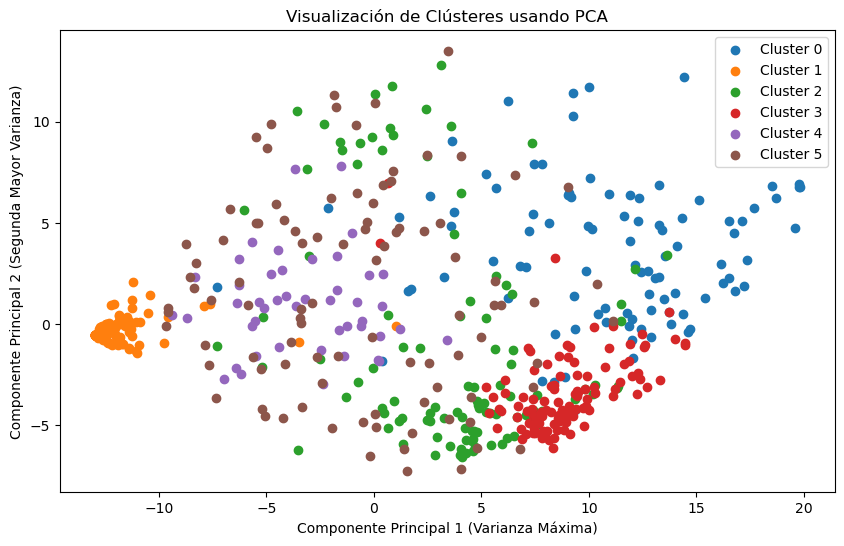

C:\Users\JMezaV\anaconda3\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


ValueError: The parameter init="pca" cannot be used with metric="precomputed".

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from tslearn.preprocessing import TimeSeriesScalerMinMax
from tslearn.clustering import TimeSeriesKMeans
from tslearn.metrics import cdist_dtw
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import time

# Agrupar por fecha y llave, y sumar la columna 'TOTAL'
energia_por_fecha = df.groupby(['LLAVE NOMBRE', 'FECHA'])['TOTAL'].sum().reset_index()

# Pivotar los datos para tener fechas como columnas y llaves como filas
pivot_df = energia_por_fecha.pivot(index='LLAVE NOMBRE', columns='FECHA', values='TOTAL').fillna(0)

# Convertir las columnas de fecha a datetime
pivot_df.columns = pd.to_datetime(pivot_df.columns)

# Añadir la columna de nombres de generadoras al DataFrame
pivot_df['LLAVE NOMBRE'] = pivot_df.index

# Muestreo: seleccionar una fracción aleatoria de los datos (por ejemplo, el 10%)
sample_df = pivot_df.sample(frac=1, random_state=0)  # Ajusta la fracción según sea necesario

# Convertir el DataFrame muestreado a un formato adecuado para DTW
data = sample_df.drop(columns=['LLAVE NOMBRE']).values

# Normalización específica de series temporales
data_normalized = TimeSeriesScalerMinMax().fit_transform(data.reshape((data.shape[0], data.shape[1], 1)))

# Empezar el cronómetro
start_time = time.time()

# Aplicar K-means usando DTW
n_clusters = 6  # Ajusta el número de clusters según sea necesario
model = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", random_state=0)
labels = model.fit_predict(data_normalized)

# Añadir los resultados al DataFrame muestreado
sample_df['Cluster'] = labels

# Reordenar las columnas para mantener 'LLAVE NOMBRE' al principio
sample_df = sample_df[['LLAVE NOMBRE', 'Cluster'] + [col for col in sample_df.columns if col not in ['LLAVE NOMBRE', 'Cluster']]]

# Calcular la matriz de distancias DTW usando cdist_dtw de manera eficiente
distances = cdist_dtw(data_normalized)

# Asegurarse de que la diagonal de la matriz sea cero
np.fill_diagonal(distances, 0)

# Calcular el índice de Silueta usando la matriz precomputada
silhouette_avg = silhouette_score(distances, labels, metric='precomputed')

# Detener el cronómetro
end_time = time.time()

# Calcular el tiempo de ejecución
execution_time = end_time - start_time

# Imprimir los resultados
print(f"Tiempo de ejecución: {execution_time:.2f} segundos")
print(f"Tiempo de ejecución: {execution_time / 60:.2f} minutos")
print(f"Índice de Silueta: {silhouette_avg:.2f}")

# Visualización de los clústeres usando PCA
data_reshaped = data_normalized.reshape(data_normalized.shape[0], -1)  # Convertir a 2D para PCA y t-SNE
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_reshaped)

plt.figure(figsize=(10, 6))
for cluster in np.unique(labels):
    plt.scatter(data_pca[labels == cluster, 0], data_pca[labels == cluster, 1], label=f'Cluster {cluster}')
plt.title("Visualización de Clústeres usando PCA")
plt.xlabel("Componente Principal 1 (Varianza Máxima)")
plt.ylabel("Componente Principal 2 (Segunda Mayor Varianza)")
plt.legend()
plt.show()

# Visualización de los clústeres usando t-SNE con init="random"
tsne = TSNE(n_components=2, perplexity=30, n_iter=300, random_state=0, metric="precomputed", init="random")
data_tsne = tsne.fit_transform(distances)

plt.figure(figsize=(10, 6))
for cluster in np.unique(labels):
    plt.scatter(data_tsne[labels == cluster, 0], data_tsne[labels == cluster, 1], label=f'Cluster {cluster}')
plt.title("Visualización de Clústeres usando t-SNE")
plt.xlabel("Componente t-SNE 1")
plt.ylabel("Componente t-SNE 2")
plt.legend()
plt.show()

# Limpiar las columnas de `pivot_df` asegurándose de que sean fechas
pivot_df.columns = pd.to_datetime(pivot_df.columns, errors='coerce')

# Eliminar columnas que no se pudieron convertir a fechas
pivot_df = pivot_df.loc[:, pivot_df.columns.notna()]

# Obtener la lista de clusters únicos
clusters = sample_df['Cluster'].unique()

# Crear un DataFrame con la columna 'LLAVE NOMBRE' y 'TIPO' de df
tipo_df = df[['LLAVE NOMBRE', 'TIPO']].drop_duplicates()

# Crear un diccionario para almacenar los totales y proporciones de tipos por cluster
totales_cluster = {}
porcentaje_tipo_total = {}

# Inicializar un DataFrame para acumular el total de cada tipo
total_tipos_df = tipo_df['TIPO'].value_counts().to_frame(name='Total').reset_index()
total_tipos_df.columns = ['TIPO', 'Total']

# Iterar sobre cada cluster para calcular los totales y proporciones
for cluster in clusters:
    # Filtrar los datos del cluster
    cluster_data = sample_df[sample_df['Cluster'] == cluster]
    
    # Obtener la lista de generadoras en el cluster
    generadoras = cluster_data['LLAVE NOMBRE'].unique()
    
    # Obtener el tipo correspondiente para cada generadora
    tipos = tipo_df[tipo_df['LLAVE NOMBRE'].isin(generadoras)]
    
    # Contar las ocurrencias de cada tipo
    tipo_counts = tipos['TIPO'].value_counts()
    
    # Guardar el total de generadoras en el cluster
    total_cluster = tipo_counts.sum()
    totales_cluster[cluster] = total_cluster
    
    # Calcular el porcentaje de cada tipo dentro del cluster y agregar el conteo
    tipo_porcentaje_y_cantidad = tipo_counts.to_frame(name='Cantidad')
    tipo_porcentaje_y_cantidad['Porcentaje'] = (tipo_counts / total_cluster) * 100
    
    # Almacenar los porcentajes y cantidades en el diccionario
    porcentaje_tipo_total[cluster] = tipo_porcentaje_y_cantidad

# Mostrar los resultados totales por tipo y por cluster
print("Proporción total de cada tipo de generadora:")
print(total_tipos_df)
print()

print("Totales, cantidades y porcentajes de cada cluster:")
for cluster, total in totales_cluster.items():
    print(f"Cluster {cluster} - Total generadoras: {total}")
    print(f"Cantidad y porcentaje por tipo en el cluster {cluster}:")
    print(porcentaje_tipo_total[cluster])
    print()  # Línea en blanco para mayor legibilidad

# Calcular las series más cercanas al centroide para cada tipo dentro de cada cluster
for cluster in clusters:
    # Filtrar los datos del cluster
    cluster_data = sample_df[sample_df['Cluster'] == cluster]
    
    # Obtener la lista de generadoras en el cluster
    generadoras = cluster_data['LLAVE NOMBRE'].unique()
    
    # Filtrar las series temporales de las generadoras en el cluster
    cluster_series = pivot_df.loc[generadoras]
    
    # Obtener los tipos de energía en el cluster
    tipos_en_cluster = tipo_df[tipo_df['LLAVE NOMBRE'].isin(generadoras)]
    
    # Iterar sobre cada tipo de energía en el cluster
    for tipo in tipos_en_cluster['TIPO'].unique():
        # Filtrar las series temporales del tipo de energía actual
        series_tipo = cluster_series.loc[tipos_en_cluster[tipos_en_cluster['TIPO'] == tipo]['LLAVE NOMBRE']]
        
        if not series_tipo.empty:
            # Calcular el centroide (media) del tipo de energía
            centroide = series_tipo.mean(axis=0)
            
            # Calcular la distancia entre cada serie temporal y el centroide usando la distancia euclidiana
            distancias = np.array([np.linalg.norm(centroide.values - serie.values) for index, serie in series_tipo.iterrows()]).reshape(-1, 1)
            
            # Encontrar las 3 series más cercanas al centroide
            indices_mas_cercanas = np.argsort(distancias, axis=0)[:3].flatten()
            series_representativas = series_tipo.iloc[indices_mas_cercanas]
            
            # Graficar las 3 series temporales representativas
            fig, ax = plt.subplots(figsize=(12, 6))
            for j, (index, serie) in enumerate(series_representativas.iterrows()):
                ax.plot(pivot_df.columns, serie, label=f'Cluster {cluster} - Tipo {tipo} - Serie {j+1}', linestyle='-', marker='o')
            
            # Configuración del gráfico
            ax.set_title(f'Series Temporales Representativas del Cluster {cluster} - Tipo {tipo}')
            ax.set_xlabel('Fecha')
            ax.set_ylabel('Valor')
            ax.xaxis.set_major_locator(mdates.MonthLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
            ax.tick_params(axis='x', rotation=45)
            ax.legend(loc='upper right')

            plt.tight_layout()
            plt.show()

In [21]:
# Crear un DataFrame con la columna 'LLAVE NOMBRE' y 'REGIÓN' de df
region_df = df[['LLAVE NOMBRE', 'REGIÓN']].drop_duplicates()

# Crear un diccionario para almacenar los totales y proporciones de regiones por cluster
totales_cluster_region = {}
porcentaje_region_total = {}

# Inicializar un DataFrame para acumular el total de cada región
total_regiones_df = region_df['REGIÓN'].value_counts().to_frame(name='Total').reset_index()
total_regiones_df.columns = ['REGIÓN', 'Total']

# Iterar sobre cada cluster para calcular los totales y proporciones
for cluster in clusters:
    # Filtrar los datos del cluster
    cluster_data = sample_df[sample_df['Cluster'] == cluster]
    
    # Obtener la lista de generadoras en el cluster
    generadoras = cluster_data['LLAVE NOMBRE'].unique()
    
    # Obtener la región correspondiente para cada generadora
    regiones = region_df[region_df['LLAVE NOMBRE'].isin(generadoras)]
    
    # Contar las ocurrencias de cada región
    region_counts = regiones['REGIÓN'].value_counts()
    
    # Guardar el total de generadoras en el cluster
    total_cluster = region_counts.sum()
    totales_cluster_region[cluster] = total_cluster
    
    # Calcular el porcentaje de cada región dentro del cluster y agregar el conteo
    region_porcentaje_y_cantidad = region_counts.to_frame(name='Cantidad')
    region_porcentaje_y_cantidad['Porcentaje'] = (region_counts / total_cluster) * 100
    
    # Almacenar los porcentajes y cantidades en el diccionario
    porcentaje_region_total[cluster] = region_porcentaje_y_cantidad

# Mostrar los resultados totales por región y por cluster
print("Proporción total de cada región de generadora:")
print(total_regiones_df)
print()

print("Totales, cantidades y porcentajes de cada cluster por región:")
for cluster, total in totales_cluster_region.items():
    print(f"Cluster {cluster} - Total generadoras: {total}")
    print(f"Cantidad y porcentaje por región en el cluster {cluster}:")
    print(porcentaje_region_total[cluster])
    print()  # Línea en blanco para mayor legibilidad

Proporción total de cada región de generadora:
                    REGIÓN  Total
0     Región de Valparaíso     89
1       Región del Bío-Bío     81
2     Región Metropolitana     78
3      Región de O'Higgins     71
4         Región del Maule     60
5        Región de Atacama     52
6       Región de Coquimbo     50
7      Región de los Lagos     33
8   Región de la Araucanía     27
9    Región de Antofagasta     27
10      Región de los Ríos     24
11         Región de Ñuble     14
12      Región de Tarapacá     13
13      Arica y Parinacota      4

Totales, cantidades y porcentajes de cada cluster por región:
Cluster 1 - Total generadoras: 175
Cantidad y porcentaje por región en el cluster 1:
                        Cantidad  Porcentaje
Región del Bío-Bío            30   17.142857
Región de Valparaíso          25   14.285714
Región de Atacama             22   12.571429
Región Metropolitana          19   10.857143
Región de los Lagos           16    9.142857
Región de O'Higgins      

In [23]:
# Crear un DataFrame con las columnas 'LLAVE NOMBRE', 'REGIÓN' y 'TIPO' de df, eliminando duplicados
region_tipo_df = df[['LLAVE NOMBRE', 'REGIÓN', 'TIPO']].drop_duplicates()

# Diccionario para almacenar los totales y proporciones de tipos por región y cluster
totales_cluster_region_tipo = {}

# Inicializar un DataFrame para acumular el total de cada región y tipo
total_regiones_df = region_tipo_df.groupby(['REGIÓN', 'TIPO']).size().to_frame(name='Total').reset_index()

# Iterar sobre cada cluster para calcular los totales y proporciones por región y tipo
for cluster in clusters:
    # Filtrar los datos del cluster
    cluster_data = sample_df[sample_df['Cluster'] == cluster]
    
    # Obtener la lista de generadoras en el cluster
    generadoras = cluster_data['LLAVE NOMBRE'].unique()
    
    # Obtener la región y tipo correspondiente para cada generadora
    regiones_tipos = region_tipo_df[region_tipo_df['LLAVE NOMBRE'].isin(generadoras)]
    
    # Contar las ocurrencias de cada combinación de región y tipo
    region_tipo_counts = regiones_tipos.groupby(['REGIÓN', 'TIPO']).size().to_frame(name='Cantidad').reset_index()
    
    # Guardar el total de generadoras en el cluster
    total_cluster = region_tipo_counts['Cantidad'].sum()
    
    # Calcular el porcentaje de cada combinación de región y tipo dentro del cluster
    region_tipo_counts['Porcentaje'] = (region_tipo_counts['Cantidad'] / total_cluster) * 100
    
    # Almacenar los resultados en el diccionario
    totales_cluster_region_tipo[cluster] = region_tipo_counts

# Mostrar los resultados totales por región y tipo en cada cluster
print("Totales, cantidades y porcentajes de cada combinación de región y tipo por cluster:")
for cluster, data in totales_cluster_region_tipo.items():
    print(f"Cluster {cluster} - Total generadoras:")
    print(data)
    print()  # Línea en blanco para mayor legibilidad


Totales, cantidades y porcentajes de cada combinación de región y tipo por cluster:
Cluster 1 - Total generadoras:
                    REGIÓN        TIPO  Cantidad  Porcentaje
0     Región Metropolitana  Hidráulica         2    1.142857
1     Región Metropolitana       Solar         2    1.142857
2     Región Metropolitana     Térmica        15    8.571429
3    Región de Antofagasta      Eólica         1    0.571429
4    Región de Antofagasta     Térmica         9    5.142857
5        Región de Atacama       Solar         1    0.571429
6        Región de Atacama     Térmica        21   12.000000
7       Región de Coquimbo     Térmica         9    5.142857
8      Región de O'Higgins  Hidráulica         3    1.714286
9      Región de O'Higgins     Térmica         7    4.000000
10      Región de Tarapacá  Hidráulica         1    0.571429
11      Región de Tarapacá       Solar         2    1.142857
12      Región de Tarapacá     Térmica         2    1.142857
13    Región de Valparaíso  Hid